In [1]:
from jetstream_hugo.jet_finding import *
from jetstream_hugo.definitions import *
from jetstream_hugo.plots import *
from jetstream_hugo.clustering import *
from jetstream_hugo.anyspell import *
from jetstream_hugo.data import *
import colormaps
from IPython.display import clear_output
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
exp = JetFindingExperiment(DataHandler(f"{DATADIR}/ERA5/plev/high_wind/6H/results/1"))
ds = exp.ds
all_jets_one_df, all_jets_over_time, flags = exp.track_jets()
props_as_df_uncat = exp.props_as_df(False)
props_as_df = exp.props_as_df(True)
all_props_over_time = exp.props_over_time(all_jets_over_time, props_as_df_uncat)
ds = exp.ds
da = exp.ds["s"]
jet_pos_da = exp.jet_position_as_da()
# props_as_df = get_double_jet_index(props_as_df, jet_pos_da)
exp_s = Experiment(DataHandler(f"{DATADIR}/ERA5/plev/high_wind/6H/results/2"))

da_s = exp_s.da
da_s = da_s.sel(time=da_s.time.dt.hour == 0)

ds_ = ds.sel(time=ds.time.dt.hour == 0)
ds_ = ds_.sel(time=ds_.time.dt.season == "JJA")

In [3]:
da_tp = open_da(
    "ERA5", "surf", "tp", "dailymean", "all", None, None, None, None, None, "all", 'dayofyear', {'dayofyear': ('win', 15)}, None,
)
da_T = open_da(
    "ERA5", "surf", "t2m", "dailymean", "all", None, None, None, None, None, "all", 'dayofyear', {'dayofyear': ('win', 15)}, None,
)
da_sst = open_da(
    "ERA5", "surf", "sst", "dailymean", "all", None, None, None, None, None, "all", 'dayofyear', {'dayofyear': ('win', 15)}, None,
)
da_mslp = open_da(
    "ERA5", "surf", "mslp", "dailymean", "all", None, None, None, None, None, "all", 'dayofyear', {'dayofyear': ('win', 15)}, None,
)
# da_apvs = open_da(
#     "ERA5", "thetalev", "apvs_int", "dailymean", "all", "JJA", None, None, None, None, 350, 'dayofyear', {'dayofyear': ('win', 15)}, None,
# )
# da_cpvs = open_da(
#     "ERA5", "thetalev", "cpvs_int", "dailymean", "all", "JJA", None, None, None, None, 350, 'dayofyear', {'dayofyear': ('win', 15)}, None,
# )
da_apvs = DataHandler.from_specs("ERA5", "thetalev", "apvs", "dailymean", "all", "JJA", None, None, None, None, 350).da
da_cpvs = DataHandler.from_specs("ERA5", "thetalev", "cpvs", "dailymean", "all", "JJA", None, None, None, None, 350).da
da_z = open_da(
    "ERA5", "plev", "z", "dailymean", "all", "JJA", None, None, None, None, 500, 'dayofyear', {'dayofyear': ('win', 15)}, None,
)

# Define all jet spells once

In [4]:
spells_from_jet_daily_stj_cs = get_persistent_jet_spells(
    props_as_df,
    "com_speed",
    "STJ",
    "JJA",
    q=0.6,
    daily=True,
    minlen=datetime.timedelta(days=6),
    fill_holes=datetime.timedelta(hours=12),
)
spells_from_jet_daily_edj_cs = get_persistent_jet_spells(
    props_as_df,
    "com_speed",
    "EDJ",
    "JJA",
    q=0.67,
    daily=True,
    minlen=datetime.timedelta(days=6),
    fill_holes=datetime.timedelta(hours=12),
)
spells_from_jet_daily_stj_pe = get_persistent_jet_spells(
    props_as_df,
    "persistence",
    "STJ",
    "JJA",
    q=0.6,
    daily=True,
    minlen=datetime.timedelta(days=9),
    fill_holes=datetime.timedelta(hours=0),
)
spells_from_jet_daily_edj_pe = get_persistent_jet_spells(
    props_as_df,
    "persistence",
    "EDJ",
    "JJA",
    q=0.6,
    daily=True,
    minlen=datetime.timedelta(days=8),
    fill_holes=datetime.timedelta(hours=0),
)
spells_list = {
    "STJ com spe": spells_from_jet_daily_stj_cs,
    "EDJ com spe": spells_from_jet_daily_edj_cs,
    "STJ lifetime": spells_from_jet_daily_stj_pe,
    "EDJ lifetime": spells_from_jet_daily_edj_pe,
}

spells_from_jet_daily_stj_cs = get_persistent_jet_spells(
    props_as_df,
    "com_speed",
    "STJ",
    "JJA",
    q=0.6,
    daily=True,
    minlen=datetime.timedelta(days=6),
    fill_holes=datetime.timedelta(hours=12),
    time_before=datetime.timedelta(days=4),
)
spells_from_jet_daily_edj_cs = get_persistent_jet_spells(
    props_as_df,
    "com_speed",
    "EDJ",
    "JJA",
    q=0.67,
    daily=True,
    minlen=datetime.timedelta(days=6),
    fill_holes=datetime.timedelta(hours=12),
    time_before=datetime.timedelta(days=4),
)
spells_from_jet_daily_stj_pe = get_persistent_jet_spells(
    props_as_df,
    "persistence",
    "STJ",
    "JJA",
    q=0.6,
    daily=True,
    minlen=datetime.timedelta(days=9),
    fill_holes=datetime.timedelta(hours=0),
    time_before=datetime.timedelta(days=4),
)
spells_from_jet_daily_edj_pe = get_persistent_jet_spells(
    props_as_df,
    "persistence",
    "EDJ",
    "JJA",
    q=0.6,
    daily=True,
    minlen=datetime.timedelta(days=8),
    fill_holes=datetime.timedelta(hours=0),
    time_before=datetime.timedelta(days=4),
)
spells_list_time_before = {
    "STJ com spe": spells_from_jet_daily_stj_cs,
    "EDJ com spe": spells_from_jet_daily_edj_cs,
    "STJ lifetime": spells_from_jet_daily_stj_pe,
    "EDJ lifetime": spells_from_jet_daily_edj_pe,
}

# compare with SOM hotspells

In [5]:
metric = "euclidean"
nx = 6
ny = 4
exp_s = Experiment(DataHandler(f"{DATADIR}/ERA5/plev/high_wind/6H/results/4"))

ds_center_path = exp_s.path.joinpath(f"som_{nx}_{ny}_pbc_{metric}_center.nc")
if not ds_center_path.is_file():
    ds = exp.ds
    ds = ds.sel(time=ds.time.dt.season=="JJA")
net, centers, labels = exp_s.som_cluster(
    nx,
    ny,
    activation_distance=metric,
    return_type=RAW_REALSPACE,
    force=False,
    sigma=2,
    train_kwargs=dict(num_epochs=20),
)
populations = net.compute_populations()
coords = net.neighborhoods.coordinates
if not ds_center_path.is_file():
    ds_center = labels_to_centers(labels, ds)
    ds_center.to_netcdf(ds_center_path)
else:
    ds_center = xr.open_dataset(ds_center_path)
mask = labels_to_mask(labels)
mask_da = xr.DataArray(mask, coords={"time": exp_s.da.time, "cluster": np.arange(net.n_nodes)})

from sklearn.metrics import pairwise_distances
from xpysom_dask.diagnostics import *

dists = pairwise_distances(net.weights)
sigma = np.quantile(dists[dists > 0].flatten(), 0.05)
spells_from_som = get_persistent_spell_times_from_som(
    labels, dists, sigma, 47, nt_before=20, nojune=True, daily=True
)
spells_list["SOM"] = spells_from_som

22
23
22
23
22


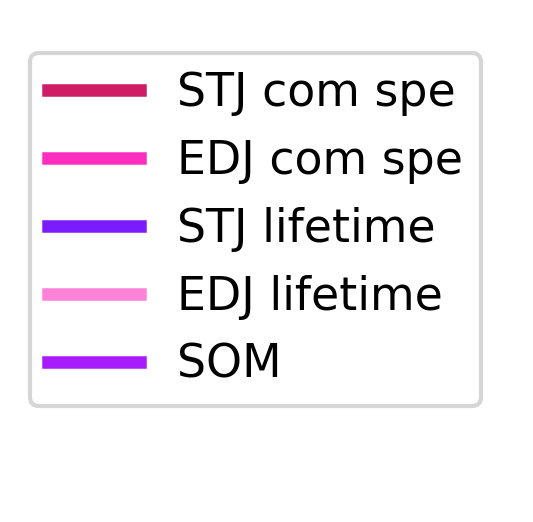

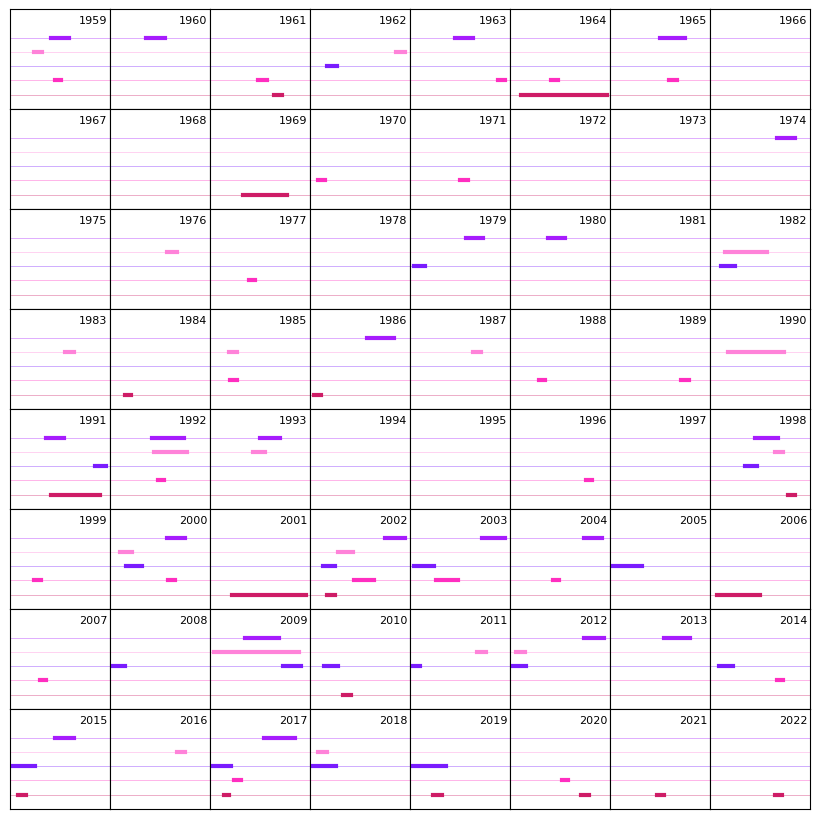

In [6]:
colors = [COLORS[3], COLORS[2], COLORS[1], COLORS_EXT[6], COLORS_EXT[1]]
for spell in spells_list.values():
    print(spell["spell"].max())
fig, ax = plt.subplots(figsize=(2, 2), dpi=300)
ax.axis("off")
for spell_name, color in zip(spells_list, colors):
    ax.plot([], [], color=color, lw=3, label=spell_name)
ax.legend()
plt.show()
fig, axes = plt.subplots(8, 8, figsize=(8, 8), gridspec_kw=dict(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1), subplot_kw=dict(xticks=[], yticks=[], xlim=[-1, 95], ylim=[-1, 6]))
axes = axes.ravel()
for ax, year in zip(axes, YEARS):
    ax.text(65, 5, f"{year}", fontsize=8)
    for j, (name_, spell) in enumerate(spells_list.items()):
        ax.plot([-1, 95], [j, j], color=colors[j], lw=.5, ls="solid", alpha=0.5)
        spell_ = spell.filter(pl.col("time").dt.year() == year)
        if len(spell_) == 0:
            continue
        x = [spell_["time"].dt.ordinal_day().first() - 152, spell_["time"].dt.ordinal_day().last() - 152]
        y = [j, j]
        ax.plot(x, y, color=colors[j], lw=3)

# Natural coordinates composites

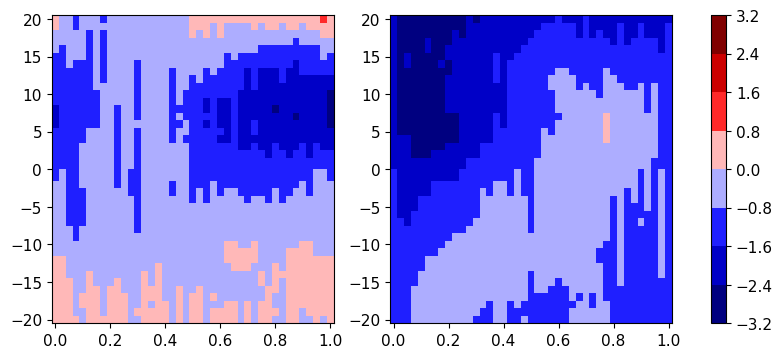

In [46]:
variable_dict = {
    "T": [da_T, 8, True, colormaps.BlWhRe],
    "tp": [da_tp, 15, True, colormaps.precip4_diff_19lev],
    "APVS": [da_apvs, 7, False, colormaps.thermal_r],
    "CPVS": [da_cpvs, 7, False, colormaps.thermal_r],
}
spells_from_jet = spells_list_time_before["EDJ lifetime"]
spells_from_jet = subset_around_onset(spells_from_jet, around_onset=datetime.timedelta(days=1))

for varname, props in variable_dict.items():
    da, nlevels, symmetric, cmap = props
    jets_during_spells_with_interp_norm_ds = gather_normal_da_jets_wrapper(all_jets_one_df, spells_from_jet, da, n_interp=40, n_bootstraps=4)
    try:
        to_plot = jets_during_spells_with_interp_norm_ds[da.name + "_interp"]
        pvals = jets_during_spells_with_interp_norm_ds["pvals"]
    except KeyError:
        to_plot = jets_during_spells_with_interp_norm_ds

    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    levels = MaxNLocator(nlevels, symmetric=symmetric).tick_values(to_plot.quantile(0.01), to_plot.quantile(0.99))
    norm = BoundaryNorm(levels, cmap.N)
    
    axes[0].pcolormesh(to_plot.norm_index, to_plot.n, to_plot[0].T, norm=norm, cmap=cmap)
    # pvals_ = pvals[0].T
    # axes[0].pcolor(pvals.norm_index, pvals.n, pvals_.where(np.amin([pvals_ * 2, (1 - pvals_) * 2], axis=0) < 0.05), hatch="/", alpha=0.)
    
    axes[1].pcolormesh(to_plot.norm_index, to_plot.n, to_plot[1].T, norm=norm, cmap=cmap)
    # pvals_ = pvals[1].T
    # axes[1].pcolor(pvals.norm_index, pvals.n, pvals_.where(np.amin([pvals_ * 2, (1 - pvals_) * 2], axis=0) < 0.05), hatch="/", alpha=0.)

    fig.colorbar(ScalarMappable(norm, cmap), ax=axes, spacing="proportional")
    break

In [42]:
jets = all_jets_one_df
varname = da.name + "_interp"
spells_from_jet = spells_list_time_before["EDJ lifetime"]
spells_from_jet = subset_around_onset(spells_from_jet, around_onset=datetime.timedelta(days=1))
times = spells_from_jet
da = da_T
n_bootstraps = 3
rng = np.random.default_rng()
orig_times = times.clone()
boostrap_len = orig_times["time"].n_unique()
all_times = jets["time"].unique().clone()
times = times[["time"]].with_row_index("inside_index").with_columns(sample_index=pl.lit(n_bootstraps, dtype=pl.UInt32))
bootstrap_block = int(np.round(boostrap_len / orig_times["spell"].n_unique()))
boostraps = rng.choice(all_times.shape[0] - bootstrap_block, size=(n_bootstraps, boostrap_len // bootstrap_block))
boostraps = boostraps[..., None] + np.arange(bootstrap_block)[None, None, :]
boostraps = boostraps.reshape(n_bootstraps, boostrap_len)
ts_bootstrapped = all_times[boostraps.flatten()].to_frame()
ts_bootstrapped = ts_bootstrapped.with_columns(
    sample_index=pl.Series(values=np.arange(len(ts_bootstrapped)) // boostrap_len, dtype=pl.UInt32),
    inside_index=pl.Series(values=np.arange(len(ts_bootstrapped)) % boostrap_len, dtype=pl.UInt32),
)
columns = ["sample_index", "inside_index", "time"]
ts_bootstrapped = pl.concat([
    ts_bootstrapped[columns],
    times[columns],
])
from jetstream_hugo.plots import _gather_normal_da_jets_wrapper
jets = times.join(jets, on="time", how="left")
jets = gather_normal_da_jets(jets, da, half_length=20, dn=1)
jets = interp_jets_to_zero_one(jets, ["t2m_interp", "is_polar"], n_interp=30)
# jets = _gather_normal_da_jets_wrapper(jets, ts_bootstrapped, da, n_interp=30)
jets.filter(pl.col("sample_index") == n_bootstraps)

time,jet ID,sample_index,inside_index,norm_index,n,t2m_interp,is_polar
datetime[ns],u32,u32,u32,f64,i64,f64,f64
1959-06-22 00:00:00,0,3,0,0.0,-20,-0.407491,0.999994
1959-06-22 00:00:00,0,3,0,0.0,-19,-0.354878,0.999994
1959-06-22 00:00:00,0,3,0,0.0,-18,-0.673988,0.999994
1959-06-22 00:00:00,0,3,0,0.0,-17,-1.039326,0.999994
1959-06-22 00:00:00,0,3,0,0.0,-16,-1.529065,0.999994
…,…,…,…,…,…,…,…
2018-06-09 00:00:00,6,3,71,1.0,16,-1.808196,1.0
2018-06-09 00:00:00,6,3,71,1.0,17,-0.27756,1.0
2018-06-09 00:00:00,6,3,71,1.0,18,1.236595,1.0


In [37]:
interp_jets_to_zero_one(gather_normal_da_jets(spells_from_jet.join(all_jets_one_df, how="left", on="time"), da, half_length=20, dn=1), ["t2m_interp", "is_polar"], n_interp=30)

jet ID,spell,relative_index,relative_time,norm_index,n,t2m_interp,is_polar
u32,u32,i64,duration[μs],f64,i64,f64,f64
0,0,-1,-1d,0.0,-20,-0.407491,0.999994
0,0,-1,-1d,0.0,-19,-0.354878,0.999994
0,0,-1,-1d,0.0,-18,-0.673988,0.999994
0,0,-1,-1d,0.0,-17,-1.039326,0.999994
0,0,-1,-1d,0.0,-16,-1.529065,0.999994
…,…,…,…,…,…,…,…
6,23,1,1d,1.0,16,-1.808196,1.0
6,23,1,1d,1.0,17,-0.27756,1.0
6,23,1,1d,1.0,18,1.236595,1.0


In [47]:
jets_during_spells_with_interp_norm_ds = gather_normal_da_jets_wrapper(all_jets_one_df, spells_from_jet, da, n_interp=40, n_bootstraps=4)
da = gather_normal_da_jets_wrapper(all_jets_one_df, spells_from_jet, da, n_interp=40, n_bootstraps=0)

In [49]:
da

<xarray.DataArray 't2m_interp' (is_polar: 2, norm_index: 41, n: 40)> Size: 26kB
array([[[-0.43852, -0.32833, -0.36311, ..., -0.59704, -0.64593,
         -0.47392],
        [-0.49417, -0.44553, -0.48197, ..., -0.55276, -0.60513,
         -0.49186],
        [-0.66144, -0.53354, -0.48153, ...,  0.14266,  0.16743,
          0.05316],
        ...,
        [-0.71983, -0.53837, -0.52599, ..., -1.75987, -1.67625,
         -1.60418],
        [-0.58345, -0.61015, -0.43848, ..., -1.41853, -1.39788,
         -1.18457],
        [-0.37146, -0.3827 , -0.30646, ..., -2.23864, -2.29376,
         -2.17523]],

       [[-0.24208, -0.20845, -0.1911 , ..., -0.37721, -0.39351,
         -0.42707],
        [-0.22547, -0.18465, -0.15065, ..., -0.45037, -0.46758,
         -0.44652],
        [-0.21665, -0.22093, -0.24923, ..., -0.52401, -0.50754,
         -0.45928],
        ...,
        [-0.19639, -0.22503, -0.22275, ..., -0.23278, -0.26316,
         -0.36853],
        [-0.14289, -0.13312, -0.1536 , ..., -0.37163, -0.30558,
         -0.34057],
        [-0.12429, -0.14286, -0.11322, ..., -0.32035, -0.32663,
         -0.28813]]])
Coordinates:
  * is_polar    (is_polar) bool 2B False True
  * norm_index  (norm_index) float64 328B 0.0 0.025 0.05 ... 0.95 0.975 1.0
  * n           (n) int64 320B -20 -19 -18 -17 -16 -15 -14 ... 15 16 17 18 19 20

In [48]:
jets_during_spells_with_interp_norm_ds["t2m_interp"]

<xarray.DataArray 't2m_interp' (is_polar: 2, norm_index: 41, n: 40)> Size: 26kB
array([[[-0.67492, -0.57374, -0.53814, ...,  0.50965,  0.79212,
          0.97077],
        [-0.73107, -0.60802, -0.58228, ...,  0.17328,  0.39069,
          0.42782],
        [-0.73163, -0.64024, -0.61617, ...,  0.11035,  0.12427,
          0.12889],
        ...,
        [-1.0303 , -0.86327, -0.69649, ...,  0.36785,  0.62672,
          0.93451],
        [-0.96087, -0.84206, -0.60092, ...,  0.60958,  0.80161,
          0.86578],
        [-0.98731, -0.76299, -0.621  , ...,  0.55451,  0.78286,
          1.19422]],

       [[-0.24704, -0.1471 , -0.08811, ..., -0.98573, -1.09874,
         -1.07993],
        [-0.32064, -0.23647, -0.19386, ..., -1.63846, -1.78161,
         -1.71964],
        [-0.21557, -0.15426, -0.13562, ..., -1.5932 , -1.6663 ,
         -1.71661],
        ...,
        [-0.584  , -0.44197, -0.35506, ..., -1.10124, -1.36518,
         -1.58212],
        [-0.63224, -0.47165, -0.36847, ..., -1.2528 , -1.4416 ,
         -1.49063],
        [-0.4398 , -0.40814, -0.37426, ..., -1.25497, -1.39467,
         -1.54795]]])
Coordinates:
  * is_polar    (is_polar) bool 2B False True
  * norm_index  (norm_index) float64 328B 0.0 0.025 0.05 ... 0.95 0.975 1.0
  * n           (n) int64 320B -20 -19 -18 -17 -16 -15 -14 ... 15 16 17 18 19 20

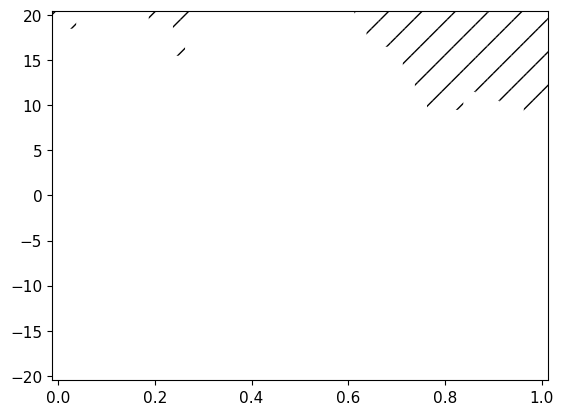

In [21]:
pvals_ = pvals[0].T
plt.pcolor(pvals.norm_index, pvals.n, pvals_.where(pvals_ > 0.9), hatch="/", alpha=0.)

In [11]:
da.name + "_interp"

't2m_interp'

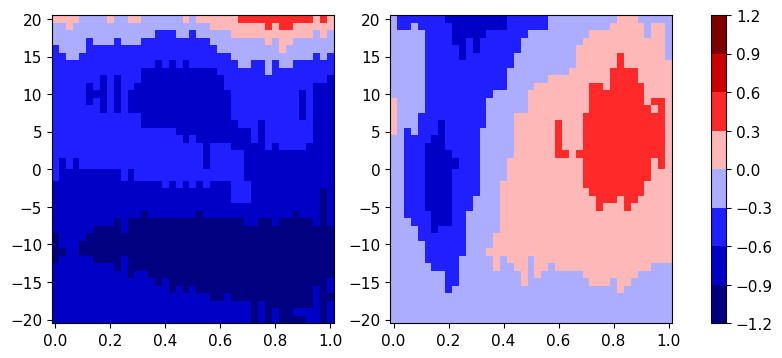

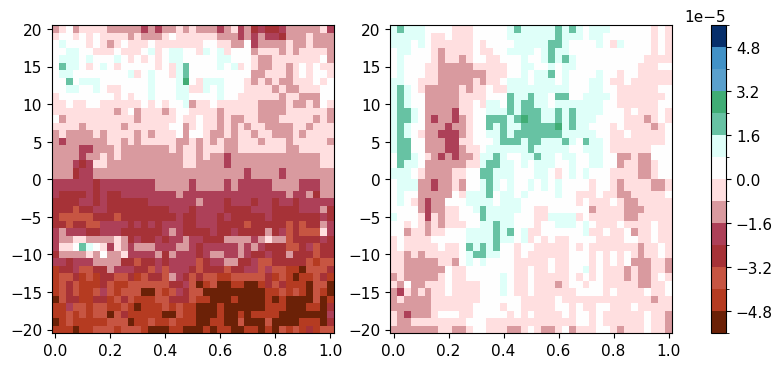

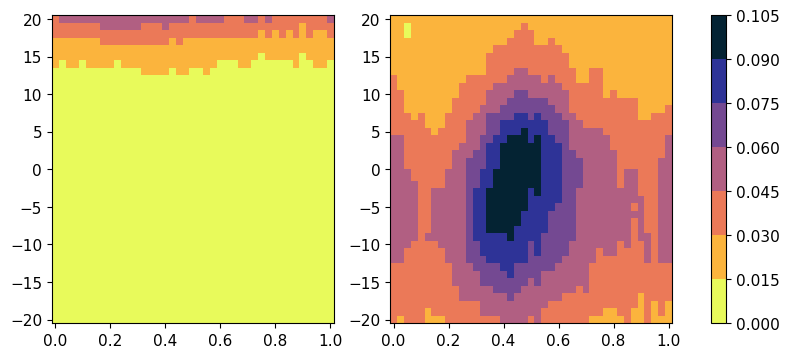

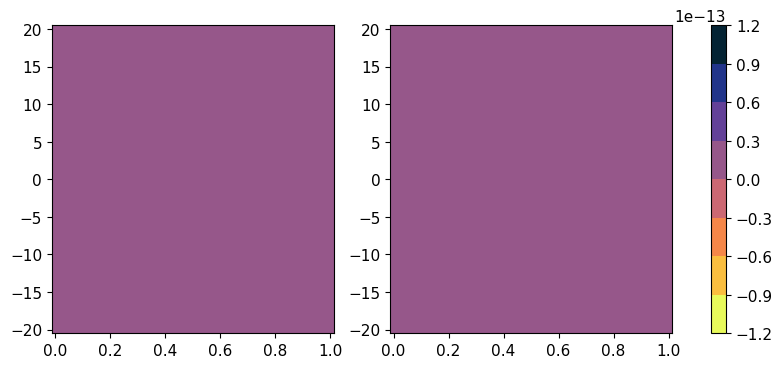

In [ ]:
variable_dict = {
    "T": [da_T, 8, True, colormaps.BlWhRe],
    "tp": [da_tp, 15, True, colormaps.precip4_diff_19lev],
    "APVS": [da_apvs, 7, False, colormaps.thermal_r],
    "CPVS": [da_cpvs, 7, False, colormaps.thermal_r],
}
time_long_jets = props_as_df.filter(pl.col("int") > props_as_df.filter(pl.col("jet") == "EDJ")["int"].quantile(0.99), pl.col("jet") == "EDJ")["time"].cast(pl.Datetime("ns"))
# random_times = np.random.choice(all_jets_one_df["time"], 8 * spells_from_jet["spell"].max())
jets_during_spells = all_jets_one_df.filter(pl.col("time").is_in(time_long_jets))

for varname, props in variable_dict.items():
    da, nlevels, symmetric, cmap = props
    jets_during_spells_with_interp_norm_ds = gather_normal_da_jets_wrapper(jets_during_spells, da, n_interp=40, around_onset=datetime.timedelta(days=2))

    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    levels = MaxNLocator(nlevels, symmetric=symmetric).tick_values(jets_during_spells_with_interp_norm_ds.quantile(0.01), jets_during_spells_with_interp_norm_ds.quantile(0.99))
    norm = BoundaryNorm(levels, cmap.N)
    axes[0].pcolormesh(jets_during_spells_with_interp_norm_ds.norm_index, jets_during_spells_with_interp_norm_ds.n, jets_during_spells_with_interp_norm_ds[0].T, norm=norm, cmap=cmap)
    axes[1].pcolormesh(jets_during_spells_with_interp_norm_ds.norm_index, jets_during_spells_with_interp_norm_ds.n, jets_during_spells_with_interp_norm_ds[1].T, norm=norm, cmap=cmap)

    fig.colorbar(ScalarMappable(norm, cmap), ax=axes, spacing="proportional")

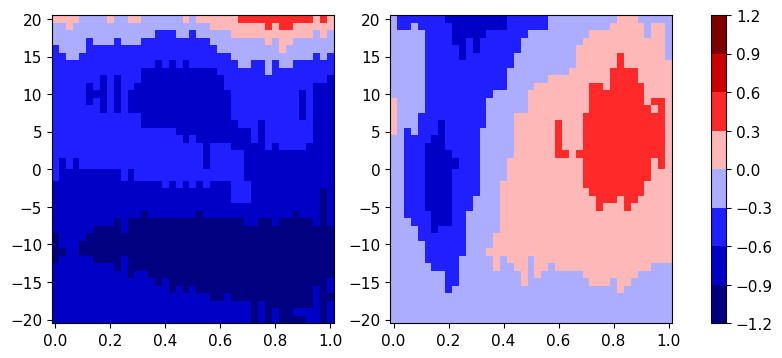

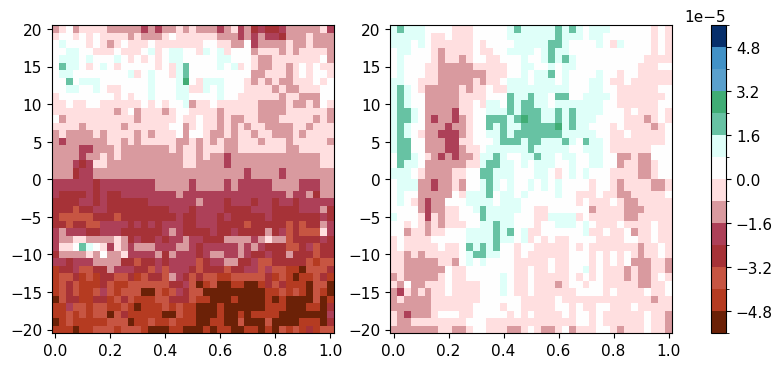

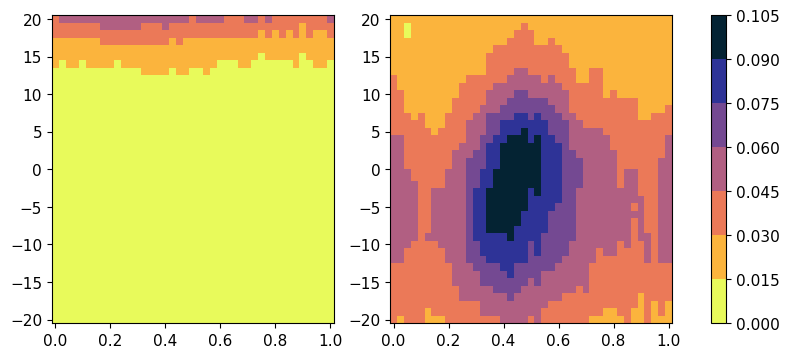

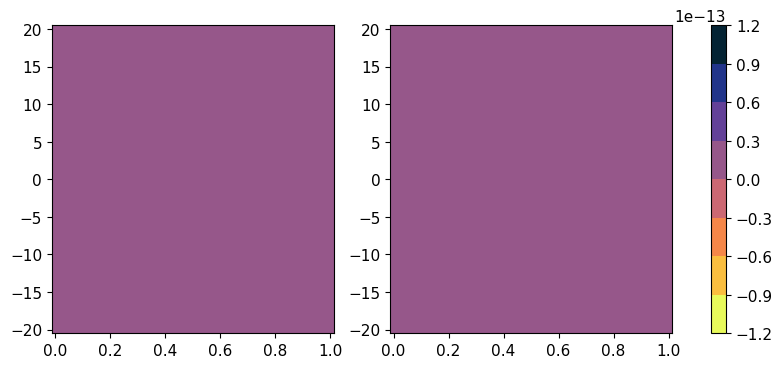

In [ ]:
variable_dict = {
    "T": [da_T, 8, True, colormaps.BlWhRe],
    "tp": [da_tp, 15, True, colormaps.precip4_diff_19lev],
    "APVS": [da_apvs, 7, False, colormaps.thermal_r],
    "CPVS": [da_cpvs, 7, False, colormaps.thermal_r],
}
time_north_jets = props_as_df.filter(pl.col("mean_lat") > props_as_df.filter(pl.col("jet") == "EDJ")["mean_lat"].quantile(0.99), pl.col("jet") == "EDJ")["time"].cast(pl.Datetime("ns"))
# random_times = np.random.choice(all_jets_one_df["time"], 8 * spells_from_jet["spell"].max())
jets_during_spells = all_jets_one_df.filter(pl.col("time").is_in(time_long_jets))

for varname, props in variable_dict.items():
    da, nlevels, symmetric, cmap = props
    jets_during_spells_with_interp_norm_ds = gather_normal_da_jets_wrapper(jets_during_spells, da, n_interp=40, around_onset=datetime.timedelta(days=2))

    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    levels = MaxNLocator(nlevels, symmetric=symmetric).tick_values(jets_during_spells_with_interp_norm_ds.quantile(0.01), jets_during_spells_with_interp_norm_ds.quantile(0.99))
    norm = BoundaryNorm(levels, cmap.N)
    axes[0].pcolormesh(jets_during_spells_with_interp_norm_ds.norm_index, jets_during_spells_with_interp_norm_ds.n, jets_during_spells_with_interp_norm_ds[0].T, norm=norm, cmap=cmap)
    axes[1].pcolormesh(jets_during_spells_with_interp_norm_ds.norm_index, jets_during_spells_with_interp_norm_ds.n, jets_during_spells_with_interp_norm_ds[1].T, norm=norm, cmap=cmap)

    fig.colorbar(ScalarMappable(norm, cmap), ax=axes, spacing="proportional")

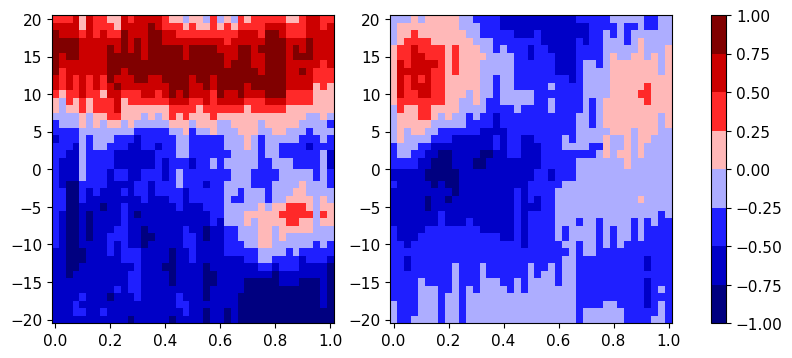

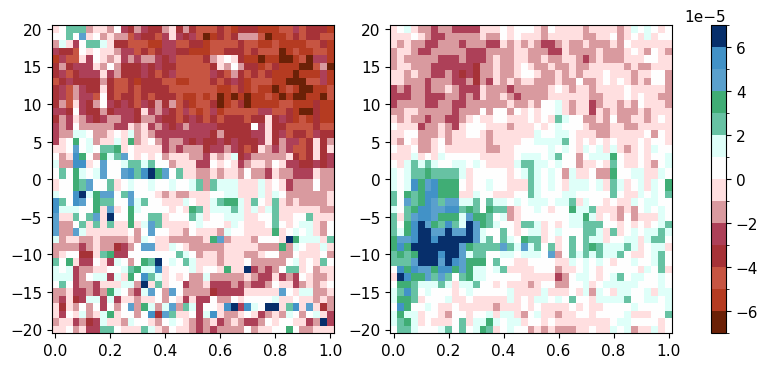

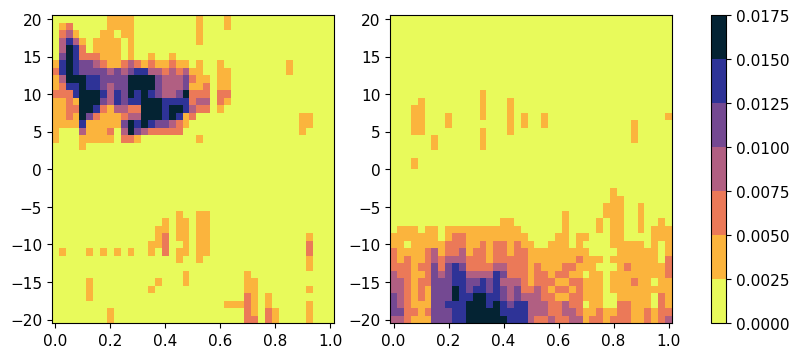

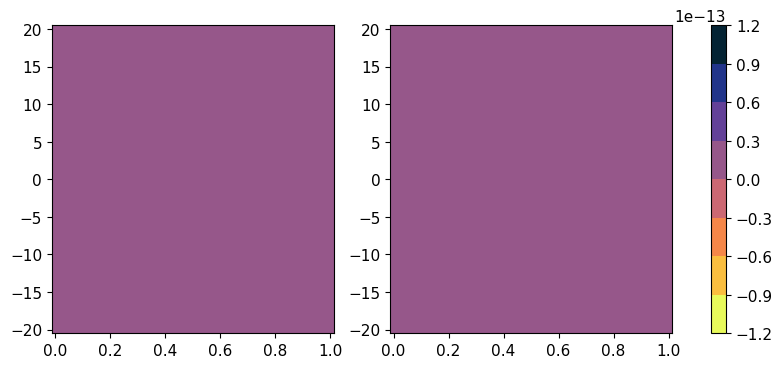

In [ ]:
variable_dict = {
    "T": [da_T, 8, True, colormaps.BlWhRe],
    "tp": [da_tp, 15, True, colormaps.precip4_diff_19lev],
    "APVS": [da_apvs, 7, False, colormaps.thermal_r],
    "CPVS": [da_cpvs, 7, False, colormaps.thermal_r],
}
spells_from_jet = spells_list_time_before["EDJ lifetime"]
jets_during_spells = mask_from_spells_pl(spells_from_jet, all_jets_one_df)

for varname, props in variable_dict.items():
    da, nlevels, symmetric, cmap = props
    jets_during_spells_with_interp_norm_ds = gather_normal_da_jets_wrapper(jets_during_spells, da, n_interp=40, around_onset=datetime.timedelta(days=2))

    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    levels = MaxNLocator(nlevels, symmetric=symmetric).tick_values(jets_during_spells_with_interp_norm_ds.quantile(0.01), jets_during_spells_with_interp_norm_ds.quantile(0.99))
    norm = BoundaryNorm(levels, cmap.N)
    axes[0].pcolormesh(jets_during_spells_with_interp_norm_ds.norm_index, jets_during_spells_with_interp_norm_ds.n, jets_during_spells_with_interp_norm_ds[0].T, norm=norm, cmap=cmap)
    axes[1].pcolormesh(jets_during_spells_with_interp_norm_ds.norm_index, jets_during_spells_with_interp_norm_ds.n, jets_during_spells_with_interp_norm_ds[1].T, norm=norm, cmap=cmap)

    fig.colorbar(ScalarMappable(norm, cmap), ax=axes, spacing="proportional")

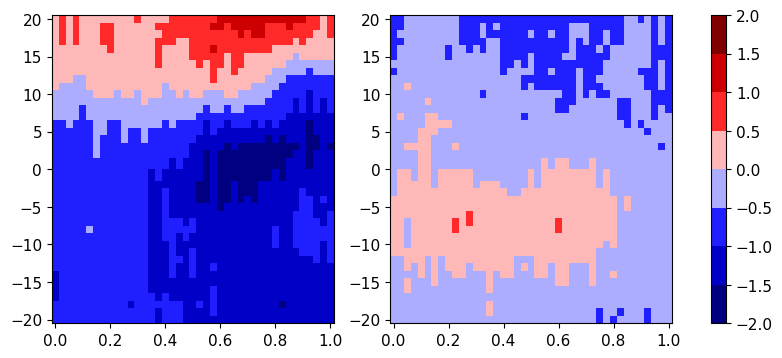

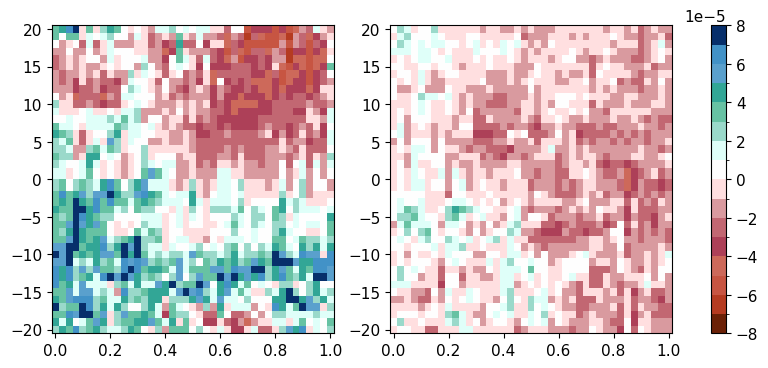

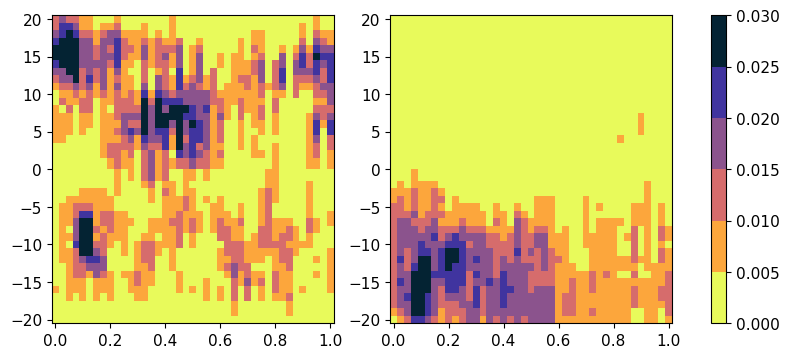

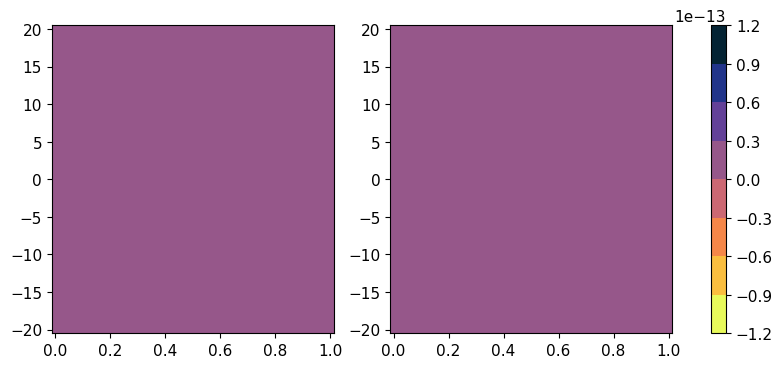

In [ ]:
variable_dict = {
    "T": [da_T, 8, True, colormaps.BlWhRe],
    "tp": [da_tp, 15, True, colormaps.precip4_diff_19lev],
    "APVS": [da_apvs, 7, False, colormaps.thermal_r],
    "CPVS": [da_cpvs, 7, False, colormaps.thermal_r],
}
spells_from_jet = spells_list["STJ lifetime"]
jets_during_spells = mask_from_spells_pl(spells_from_jet, all_jets_one_df)

for varname, props in variable_dict.items():
    da, nlevels, symmetric, cmap = props
    jets_during_spells_with_interp_norm_ds = gather_normal_da_jets_wrapper(jets_during_spells, da, n_interp=40, around_onset=datetime.timedelta(days=2))

    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    levels = MaxNLocator(nlevels, symmetric=symmetric).tick_values(jets_during_spells_with_interp_norm_ds.quantile(0.01), jets_during_spells_with_interp_norm_ds.quantile(0.99))
    norm = BoundaryNorm(levels, cmap.N)
    axes[0].pcolormesh(jets_during_spells_with_interp_norm_ds.norm_index, jets_during_spells_with_interp_norm_ds.n, jets_during_spells_with_interp_norm_ds[0].T, norm=norm, cmap=cmap)
    axes[1].pcolormesh(jets_during_spells_with_interp_norm_ds.norm_index, jets_during_spells_with_interp_norm_ds.n, jets_during_spells_with_interp_norm_ds[1].T, norm=norm, cmap=cmap)

    fig.colorbar(ScalarMappable(norm, cmap), ax=axes, spacing="proportional")

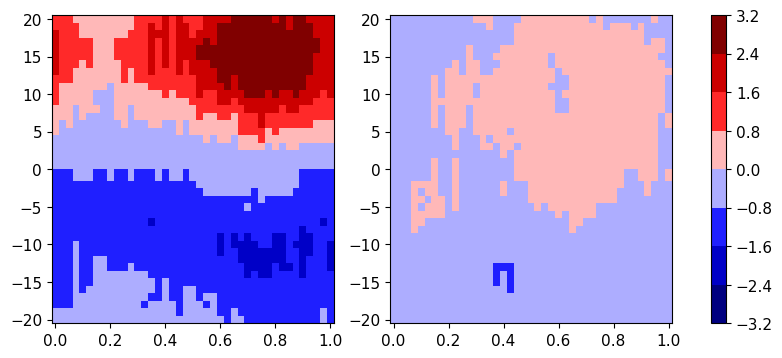

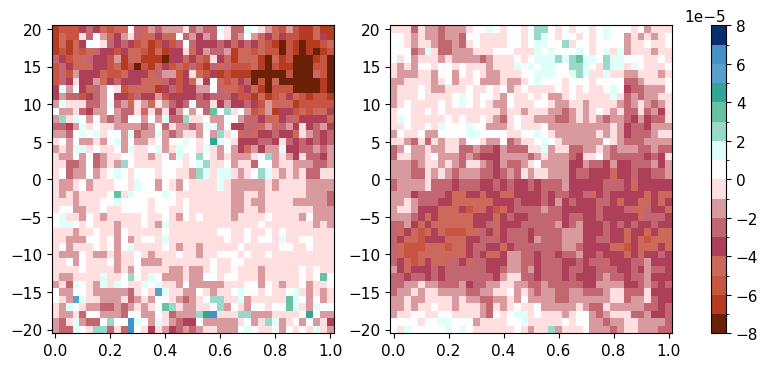

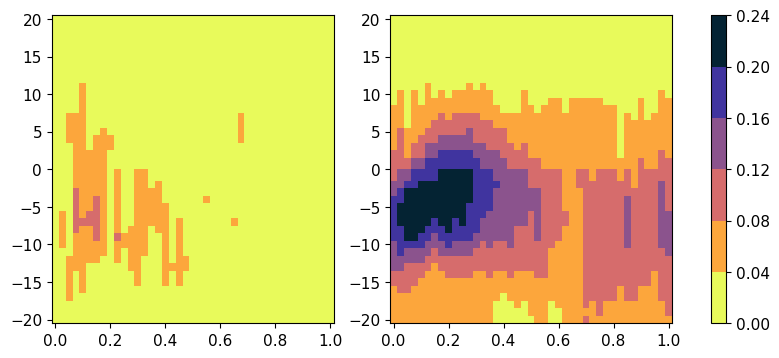

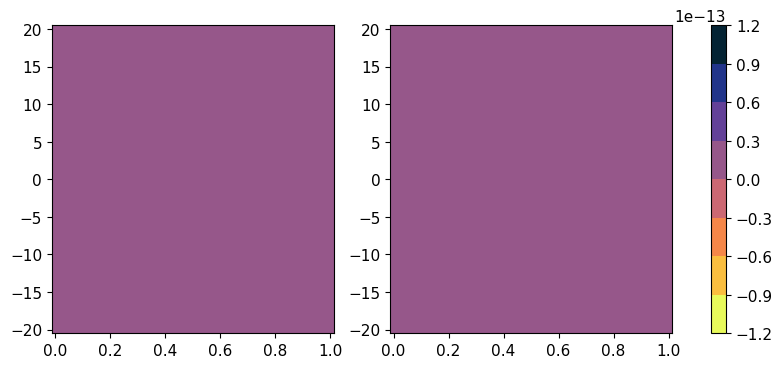

In [ ]:
variable_dict = {
    "T": [da_T, 8, True, colormaps.BlWhRe],
    "tp": [da_tp, 15, True, colormaps.precip4_diff_19lev],
    "APVS": [da_apvs, 7, False, colormaps.thermal_r],
    "CPVS": [da_cpvs, 7, False, colormaps.thermal_r],
}
spells_from_jet = spells_list["EDJ com spe"]
jets_during_spells = mask_from_spells_pl(spells_from_jet, all_jets_one_df)

for varname, props in variable_dict.items():
    da, nlevels, symmetric, cmap = props
    jets_during_spells_with_interp_norm_ds = gather_normal_da_jets_wrapper(jets_during_spells, da, n_interp=40, around_onset=datetime.timedelta(days=2))

    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    levels = MaxNLocator(nlevels, symmetric=symmetric).tick_values(jets_during_spells_with_interp_norm_ds.quantile(0.01), jets_during_spells_with_interp_norm_ds.quantile(0.99))
    norm = BoundaryNorm(levels, cmap.N)
    axes[0].pcolormesh(jets_during_spells_with_interp_norm_ds.norm_index, jets_during_spells_with_interp_norm_ds.n, jets_during_spells_with_interp_norm_ds[0].T, norm=norm, cmap=cmap)
    axes[1].pcolormesh(jets_during_spells_with_interp_norm_ds.norm_index, jets_during_spells_with_interp_norm_ds.n, jets_during_spells_with_interp_norm_ds[1].T, norm=norm, cmap=cmap)

    fig.colorbar(ScalarMappable(norm, cmap), ax=axes, spacing="proportional")

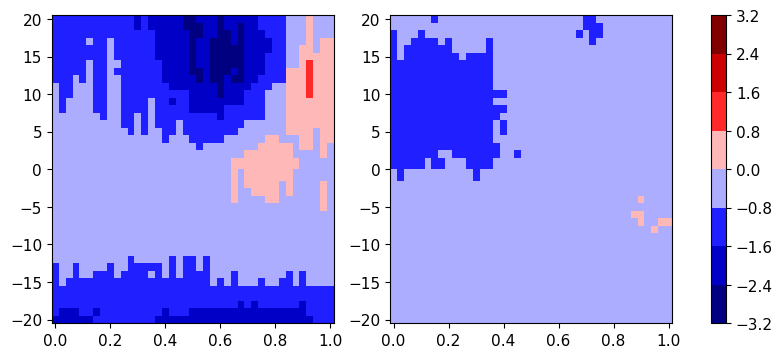

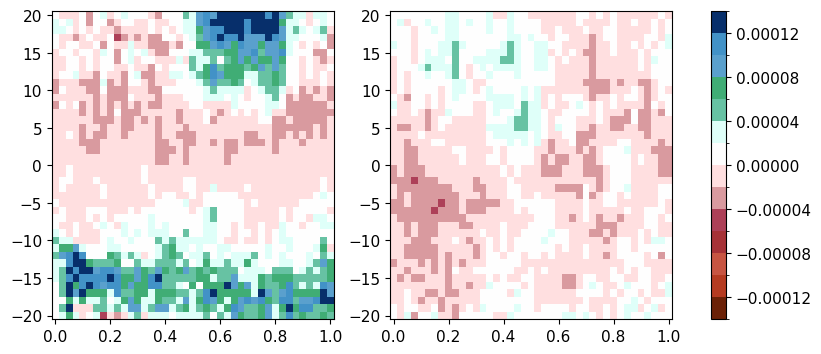

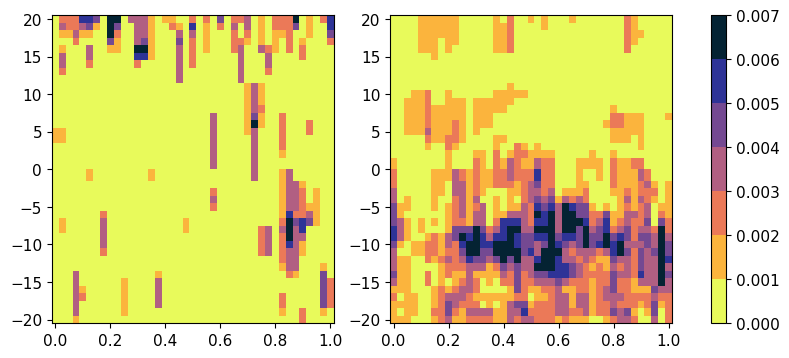

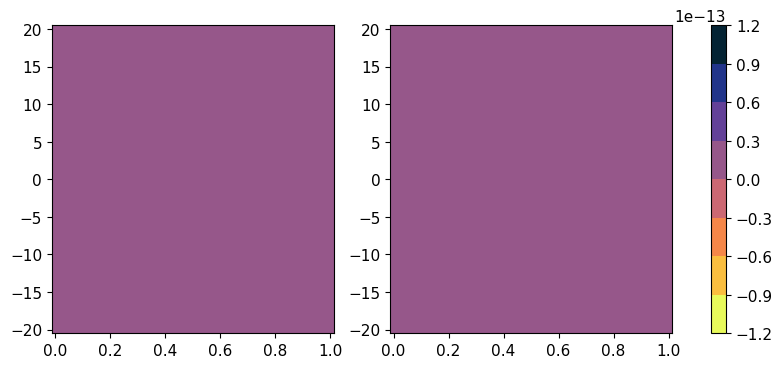

In [ ]:
variable_dict = {
    "T": [da_T, 8, True, colormaps.BlWhRe],
    "tp": [da_tp, 15, True, colormaps.precip4_diff_19lev],
    "APVS": [da_apvs, 7, False, colormaps.thermal_r],
    "CPVS": [da_cpvs, 7, False, colormaps.thermal_r],
}
spells_from_jet = spells_list["STJ com spe"]
jets_during_spells = mask_from_spells_pl(spells_from_jet, all_jets_one_df)

for varname, props in variable_dict.items():
    da, nlevels, symmetric, cmap = props
    jets_during_spells_with_interp_norm_ds = gather_normal_da_jets_wrapper(jets_during_spells, da, n_interp=40, around_onset=datetime.timedelta(days=2))

    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    levels = MaxNLocator(nlevels, symmetric=symmetric).tick_values(jets_during_spells_with_interp_norm_ds.quantile(0.01), jets_during_spells_with_interp_norm_ds.quantile(0.99))
    norm = BoundaryNorm(levels, cmap.N)
    axes[0].pcolormesh(jets_during_spells_with_interp_norm_ds.norm_index, jets_during_spells_with_interp_norm_ds.n, jets_during_spells_with_interp_norm_ds[0].T, norm=norm, cmap=cmap)
    axes[1].pcolormesh(jets_during_spells_with_interp_norm_ds.norm_index, jets_during_spells_with_interp_norm_ds.n, jets_during_spells_with_interp_norm_ds[1].T, norm=norm, cmap=cmap)

    fig.colorbar(ScalarMappable(norm, cmap), ax=axes, spacing="proportional")

# Relative time series

23


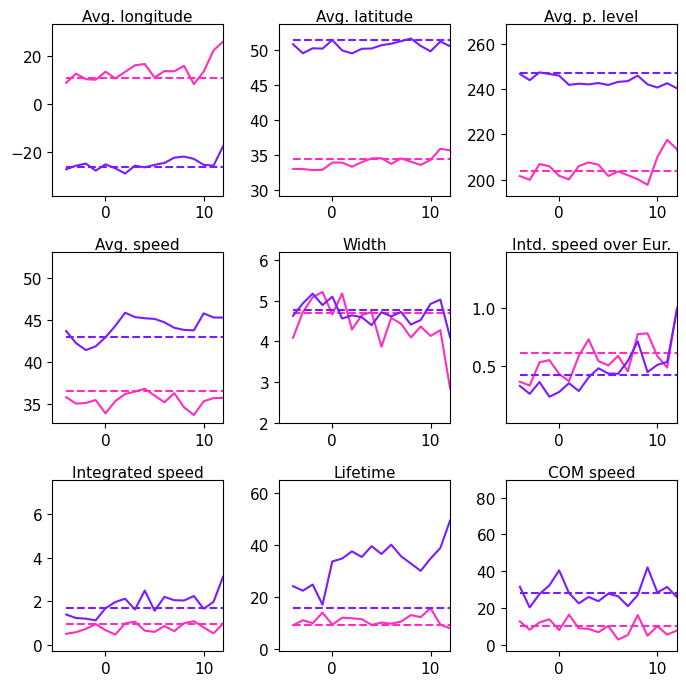

In [10]:
spells_from_jet = spells_list_time_before["EDJ lifetime"]
props_masked = mask_from_spells_pl(spells_from_jet, props_as_df)
props_as_df_summer = props_as_df.filter(pl.col("time").dt.month().is_in([6, 7, 8]))
data_vars = ["mean_lon", "mean_lat", "mean_lev", "mean_s", "width", "int_over_europe", "int", "persistence", "com_speed"]
aggs = {col: pl.col(col).mean() for col in data_vars}
aggs = aggs | {"alive": pl.col("time").len()}
mean_ps = props_masked.group_by(["relative_index", "jet"], maintain_order=True).agg(**aggs)
fig, axes = plt.subplots(3, 3, figsize=(7, 7))
axes = axes.ravel()
x = mean_ps["relative_index"].unique().to_numpy()
means = props_as_df_summer.group_by("jet", maintain_order=True).mean()
for j, jet in enumerate(["STJ", "EDJ"]):
    to_plot = mean_ps.filter(pl.col("jet") == jet)
    for ax, data_var in zip(axes, data_vars):
        factor = 1e9 if data_var in ["int_over_europe", "int"] else 1
        factor = 1e5 if data_var == "width" else factor
        ax.plot(x, to_plot[data_var] / factor, color=COLORS[2 - j])
        mean = means[j, data_var] / factor
        ax.plot([x[0], x[-1]], [mean, mean], color=COLORS[2 - j], ls="dashed")
        if j == 0:
            ax.set_title(PRETTIER_VARNAME[data_var])
for ax in axes:
    ax.set_xlim([ax.get_xlim()[0], 12])
print(props_masked["spell"].max())
fig.set_tight_layout(True)
fig.savefig(f"{FIGURES}/persistent_spells/props_edj_persistence.png")

22


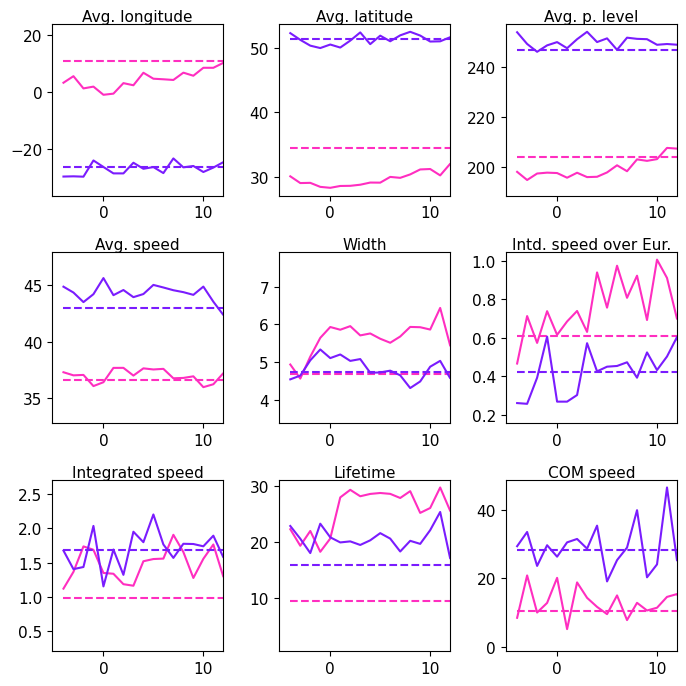

In [11]:
spells_from_jet = spells_list_time_before["STJ lifetime"]
props_masked = mask_from_spells_pl(spells_from_jet, props_as_df)
props_as_df_summer = props_as_df.filter(pl.col("time").dt.month().is_in([6, 7, 8]))
data_vars = ["mean_lon", "mean_lat", "mean_lev", "mean_s", "width", "int_over_europe", "int", "persistence", "com_speed"]
aggs = {col: pl.col(col).mean() for col in data_vars}
aggs = aggs | {"alive": pl.col("time").len()}
mean_ps = props_masked.group_by(["relative_index", "jet"], maintain_order=True).agg(**aggs)
fig, axes = plt.subplots(3, 3, figsize=(7, 7))
axes = axes.ravel()
x = mean_ps["relative_index"].unique().to_numpy()
means = props_as_df_summer.group_by("jet", maintain_order=True).mean()
for j, jet in enumerate(["STJ", "EDJ"]):
    to_plot = mean_ps.filter(pl.col("jet") == jet)
    for ax, data_var in zip(axes, data_vars):
        factor = 1e9 if data_var in ["int_over_europe", "int"] else 1
        factor = 1e5 if data_var == "width" else factor
        ax.plot(x, to_plot[data_var] / factor, color=COLORS[2 - j])
        mean = means[j, data_var] / factor
        ax.plot([x[0], x[-1]], [mean, mean], color=COLORS[2 - j], ls="dashed")
        if j == 0:
            ax.set_title(PRETTIER_VARNAME[data_var])
for ax in axes:
    ax.set_xlim([ax.get_xlim()[0], 12])
print(props_masked["spell"].max())
fig.set_tight_layout(True)
fig.savefig(f"{FIGURES}/persistent_spells/props_stj_persistence.png")

# Relative anomaly time series

In [12]:
props_anom = compute_anomalies_pl(props_as_df, smooth_clim=7 * 4, normalize=True)

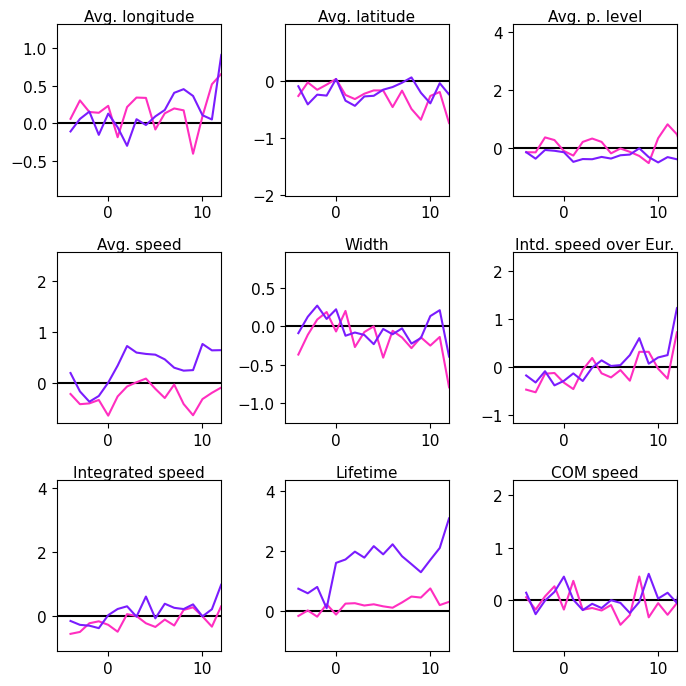

In [14]:
spells_from_jet = spells_list_time_before["EDJ lifetime"]
props_masked = mask_from_spells_pl(spells_from_jet, props_anom)
data_vars = ["mean_lon", "mean_lat", "mean_lev", "mean_s", "width", "int_over_europe", "int", "persistence", "com_speed"]
aggs = {col: pl.col(col).mean() for col in data_vars}
aggs = aggs | {"alive": pl.col("time").len()}
mean_ps = props_masked.group_by(["relative_index", "jet"], maintain_order=True).agg(**aggs)
fig, axes = plt.subplots(3, 3, figsize=(7, 7), tight_layout=True)
axes = axes.ravel()
x = mean_ps["relative_index"].unique().to_numpy()
for j, jet in enumerate(["STJ", "EDJ"]):
    to_plot = mean_ps.filter(pl.col("jet") == jet)
    for ax, data_var in zip(axes, data_vars):
        ax.plot(x, to_plot[data_var], color=COLORS[2 - j])
        if j == 0:
            ax.set_title(PRETTIER_VARNAME[data_var])
for ax in axes:
    xlim = ax.get_xlim()
    ax.plot(xlim, [0, 0], color="black", zorder=-1)
    ax.set_xlim([xlim[0], 12])
props_masked["spell"].max()
fig.savefig(f"{FIGURES}/persistent_spells/props_anom_edj_persistence.png")

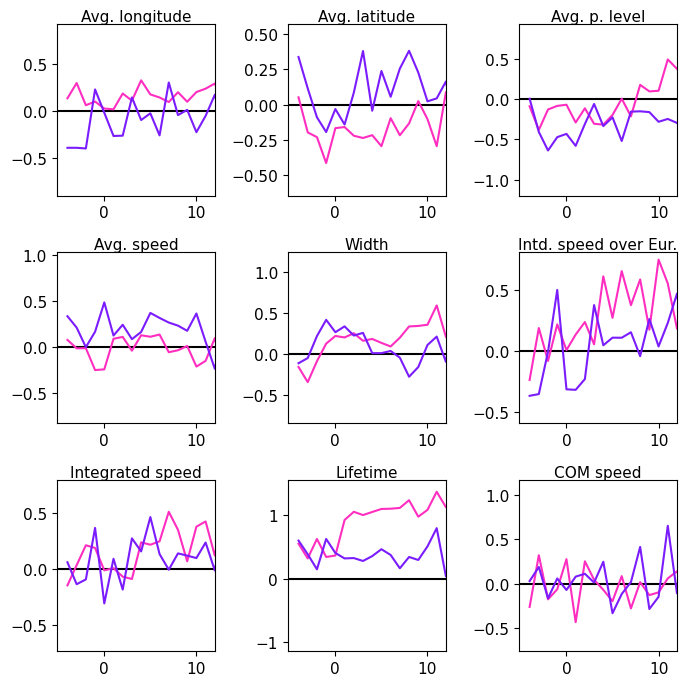

In [15]:
spells_from_jet = spells_list_time_before["STJ lifetime"]
props_masked = mask_from_spells_pl(spells_from_jet, props_anom)
data_vars = ["mean_lon", "mean_lat", "mean_lev", "mean_s", "width", "int_over_europe", "int", "persistence", "com_speed"]
aggs = {col: pl.col(col).mean() for col in data_vars}
aggs = aggs | {"alive": pl.col("time").len()}
mean_ps = props_masked.group_by(["relative_index", "jet"], maintain_order=True).agg(**aggs)
fig, axes = plt.subplots(3, 3, figsize=(7, 7), tight_layout=True)
axes = axes.ravel()
x = mean_ps["relative_index"].unique().to_numpy()
for j, jet in enumerate(["STJ", "EDJ"]):
    to_plot = mean_ps.filter(pl.col("jet") == jet)
    for ax, data_var in zip(axes, data_vars):
        ax.plot(x, to_plot[data_var], color=COLORS[2 - j])
        if j == 0:
            ax.set_title(PRETTIER_VARNAME[data_var])
for ax in axes:
    xlim = ax.get_xlim()
    ax.plot(xlim, [0, 0], color="black", zorder=-1)
    ax.set_xlim([xlim[0], 12])
props_masked["spell"].max()
fig.savefig(f"{FIGURES}/persistent_spells/props_anom_stj_persistence.png")

# Relative time composites

23
24


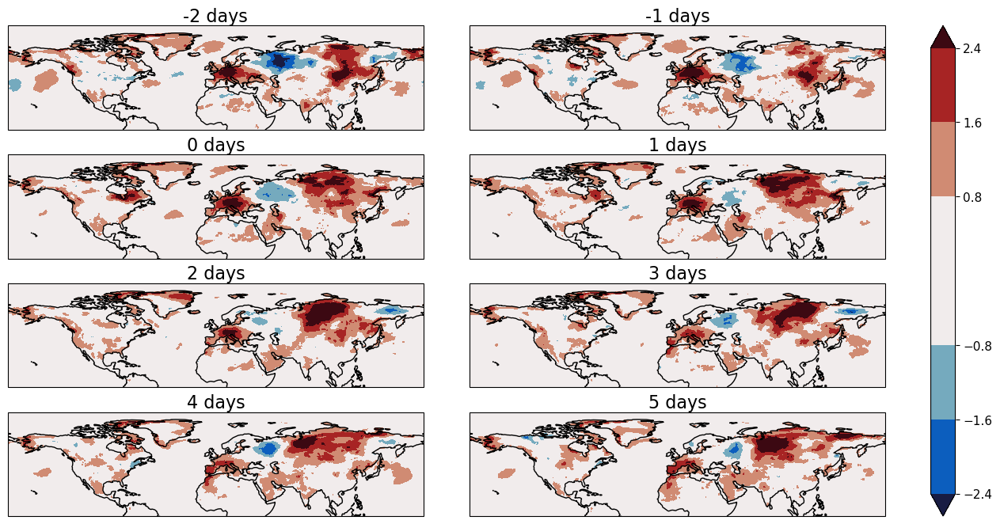

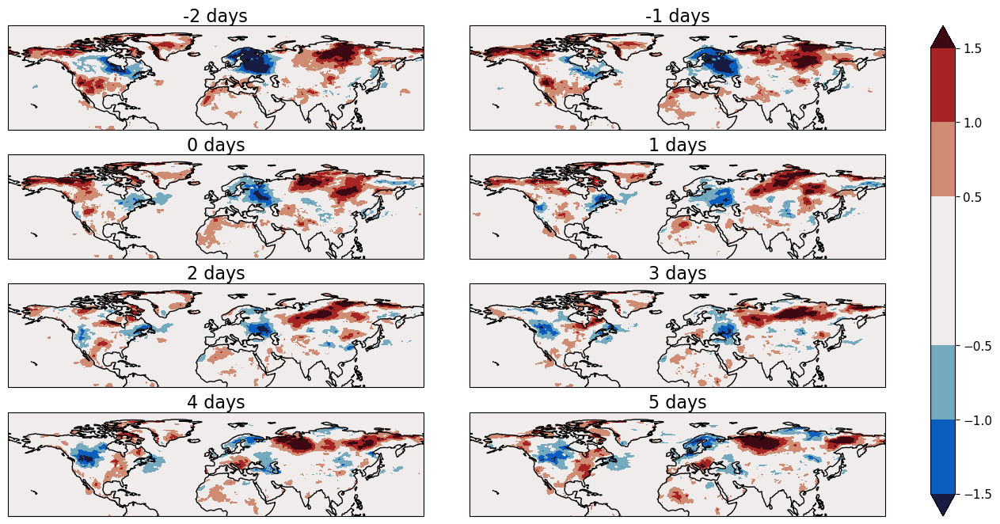

In [22]:
da = da_T.copy()
da = compute(da.sel(time=da.time.dt.season == "JJA"))
plot_kwargs = {
    "cmap": colormaps.balance,
    "levels": 7
}

clu = Clusterplot(4, 2, get_region(da))
spells_from_jet_daily = spells_list_time_before["STJ lifetime"]
to_plot = mask_from_spells_pl(spells_from_jet_daily, da)
n_spells = to_plot.spell.shape[0]
print(n_spells)
to_plot = to_plot.mean("spell").sel(relative_index=[-2, -1, 0, 1, 2, 3, 4, 5])
_ = clu.add_contourf(
    to_plot,
    titles=to_plot.relative_time.values.astype("timedelta64[D]"),
    **plot_kwargs
)

clu = Clusterplot(4, 2, get_region(da))
spells_from_jet_daily = spells_list_time_before["EDJ lifetime"]
to_plot = mask_from_spells_pl(spells_from_jet_daily, da)
n_spells = to_plot.spell.shape[0]
print(n_spells)
to_plot = to_plot.mean("spell").sel(relative_index=[-2, -1, 0, 1, 2, 3, 4, 5])
_ = clu.add_contourf(
    to_plot,
    titles=to_plot.relative_time.values.astype("timedelta64[D]"),
    **plot_kwargs
)

23
24


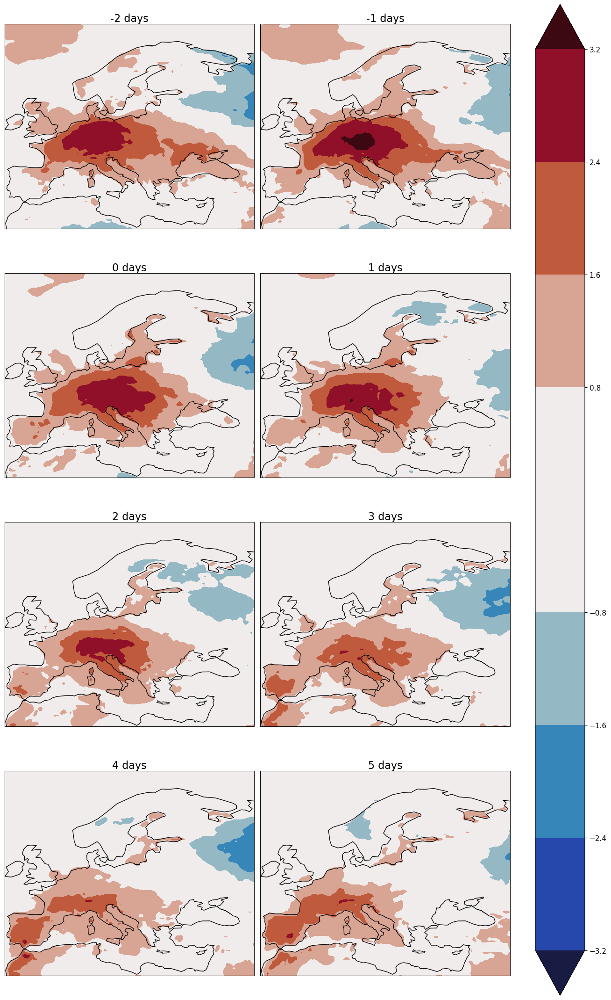

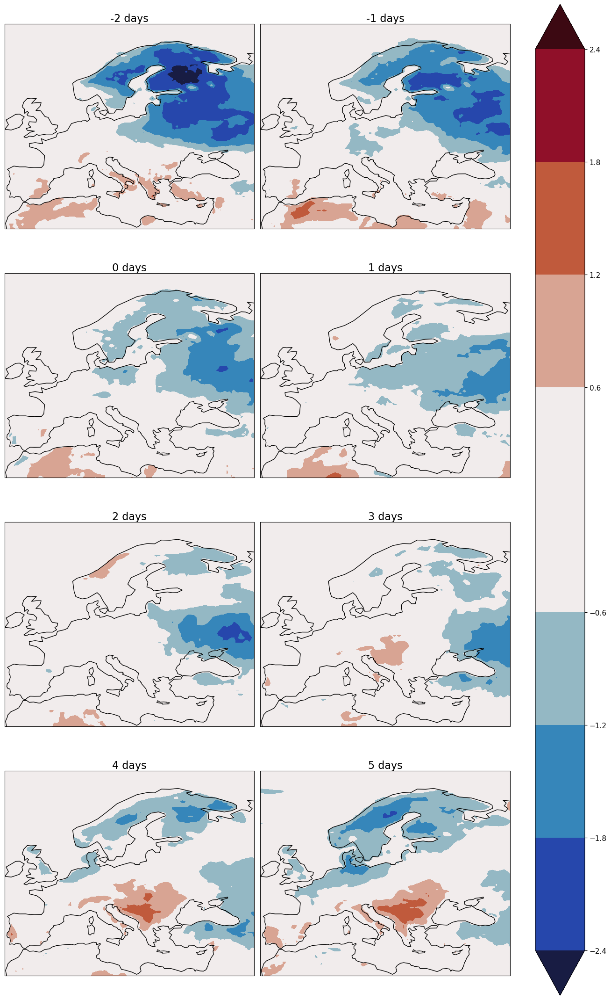

In [31]:
da = da_T.sel(lon=slice(-10, 45), lat=slice(30, 75)).copy()
da = compute(da.sel(time=da.time.dt.season == "JJA"))
plot_kwargs = {
    "cmap": colormaps.balance,
    "levels": 7
}

clu = Clusterplot(4, 2, get_region(da))
spells_from_jet_daily = spells_list_time_before["STJ lifetime"]
to_plot = mask_from_spells_pl(spells_from_jet_daily, da)
n_spells = to_plot.spell.shape[0]
print(n_spells)
to_plot = to_plot.mean("spell").sel(relative_index=[-2, -1, 0, 1, 2, 3, 4, 5])
_ = clu.add_contourf(
    to_plot,
    titles=to_plot.relative_time.values.astype("timedelta64[D]"),
    **plot_kwargs
)

clu = Clusterplot(4, 2, get_region(da))
spells_from_jet_daily = spells_list_time_before["EDJ lifetime"]
to_plot = mask_from_spells_pl(spells_from_jet_daily, da)
n_spells = to_plot.spell.shape[0]
print(n_spells)
to_plot = to_plot.mean("spell").sel(relative_index=[-2, -1, 0, 1, 2, 3, 4, 5])
_ = clu.add_contourf(
    to_plot,
    titles=to_plot.relative_time.values.astype("timedelta64[D]"),
    **plot_kwargs
)

23
24


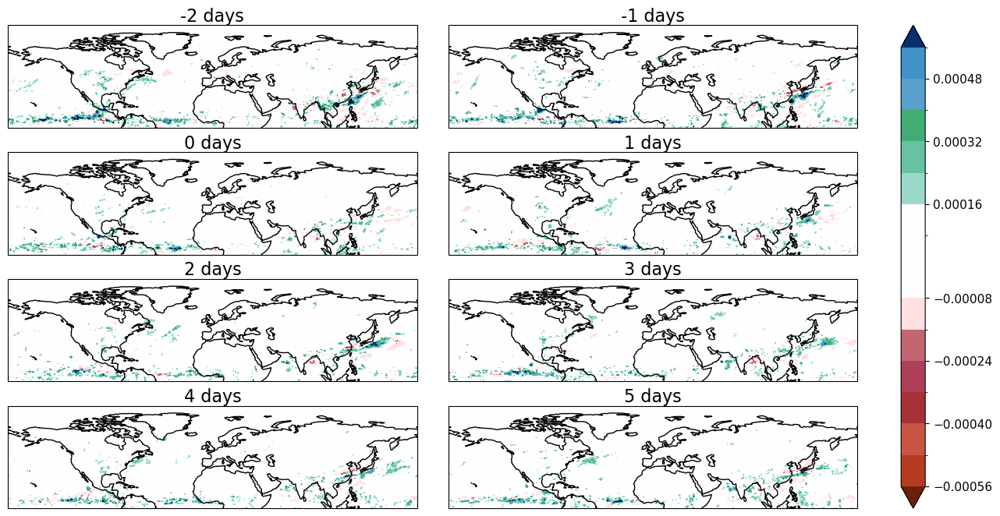

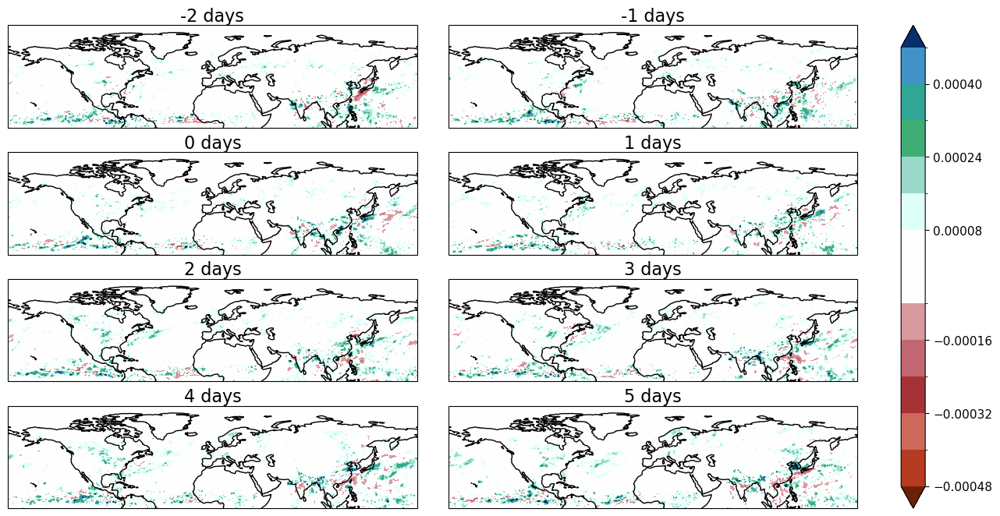

In [23]:
da = da_tp.copy()
da = compute(da.sel(time=da.time.dt.season == "JJA"))
plot_kwargs = {
    "cmap": colormaps.precip4_diff_19lev,
    "levels": 13,
    "q": 0.999,
    "transparify": 0,
}

clu = Clusterplot(4, 2, get_region(da))
spells_from_jet_daily = spells_list_time_before["STJ lifetime"]
to_plot = mask_from_spells_pl(spells_from_jet_daily, da)
n_spells = to_plot.spell.shape[0]
print(n_spells)
to_plot = to_plot.mean("spell").sel(relative_index=[-2, -1, 0, 1, 2, 3, 4, 5])
_ = clu.add_contourf(
    to_plot,
    titles=to_plot.relative_time.values.astype("timedelta64[D]"),
    **plot_kwargs
)

clu = Clusterplot(4, 2, get_region(da))
spells_from_jet_daily = spells_list_time_before["EDJ lifetime"]
to_plot = mask_from_spells_pl(spells_from_jet_daily, da)
n_spells = to_plot.spell.shape[0]
print(n_spells)
to_plot = to_plot.mean("spell").sel(relative_index=[-2, -1, 0, 1, 2, 3, 4, 5])
_ = clu.add_contourf(
    to_plot,
    titles=to_plot.relative_time.values.astype("timedelta64[D]"),
    **plot_kwargs
)

23
24


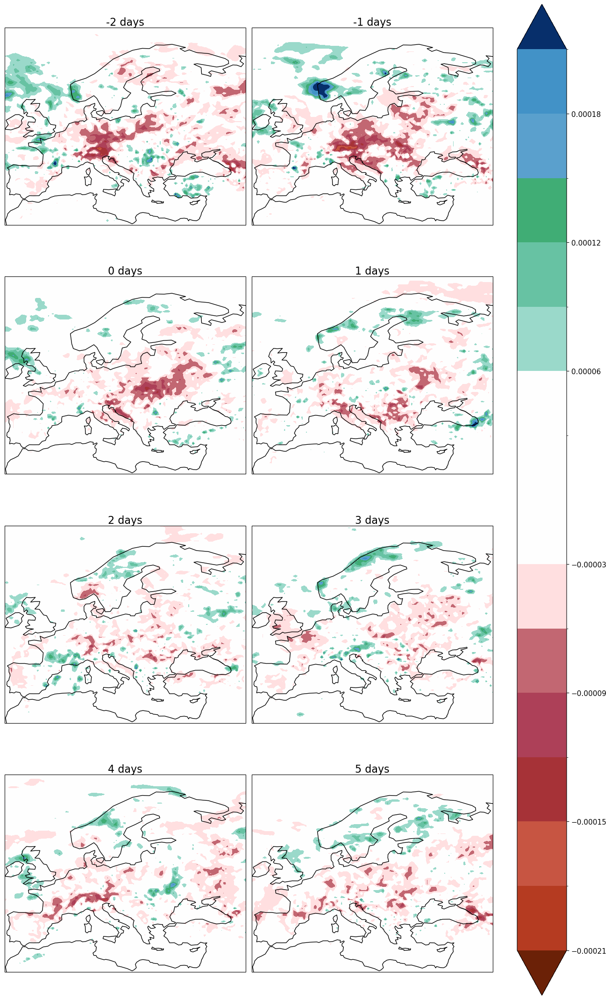

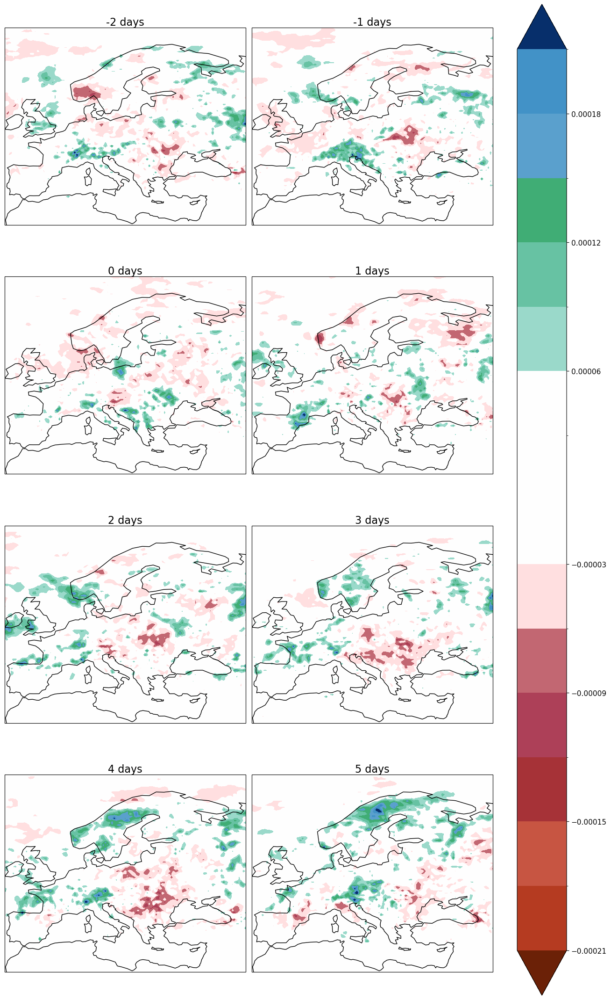

In [32]:
da = da_tp.sel(lon=slice(-10, 45), lat=slice(30, 75)).copy()
da = compute(da.sel(time=da.time.dt.season == "JJA"))
plot_kwargs = {
    "cmap": colormaps.precip4_diff_19lev,
    "levels": 13,
    "q": 0.999,
    "transparify": 0,
}

clu = Clusterplot(4, 2, get_region(da))
spells_from_jet_daily = spells_list_time_before["STJ lifetime"]
to_plot = mask_from_spells_pl(spells_from_jet_daily, da)
n_spells = to_plot.spell.shape[0]
print(n_spells)
to_plot = to_plot.mean("spell").sel(relative_index=[-2, -1, 0, 1, 2, 3, 4, 5])
_ = clu.add_contourf(
    to_plot,
    titles=to_plot.relative_time.values.astype("timedelta64[D]"),
    **plot_kwargs
)

clu = Clusterplot(4, 2, get_region(da))
spells_from_jet_daily = spells_list_time_before["EDJ lifetime"]
to_plot = mask_from_spells_pl(spells_from_jet_daily, da)
n_spells = to_plot.spell.shape[0]
print(n_spells)
to_plot = to_plot.mean("spell").sel(relative_index=[-2, -1, 0, 1, 2, 3, 4, 5])
_ = clu.add_contourf(
    to_plot,
    titles=to_plot.relative_time.values.astype("timedelta64[D]"),
    **plot_kwargs
)

23
24


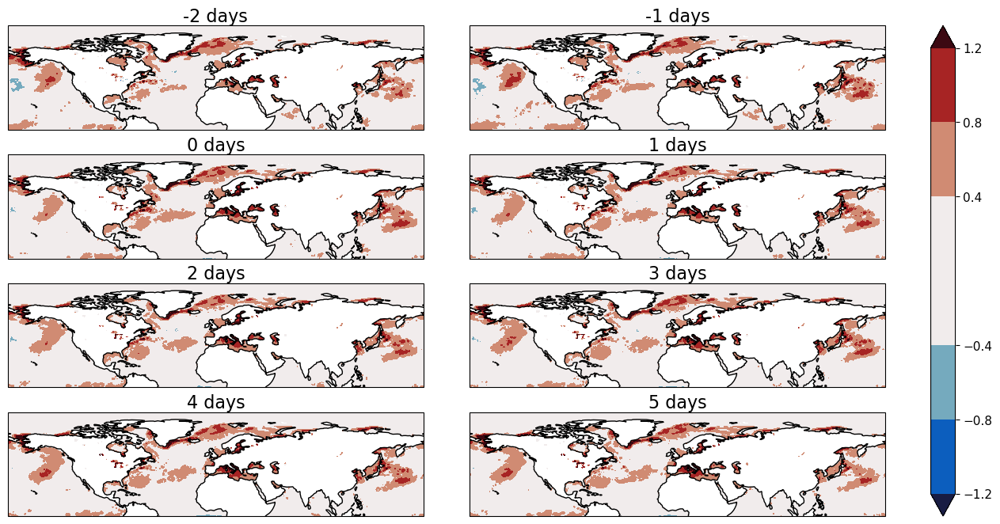

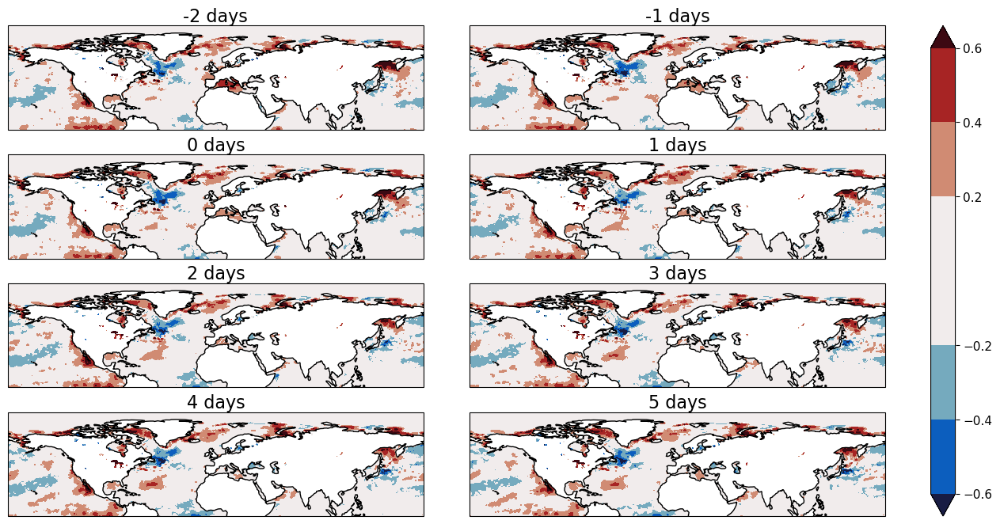

In [24]:
da = da_sst.copy()
da = compute(da.sel(time=da.time.dt.season == "JJA"))
plot_kwargs = {
    "cmap": colormaps.balance,
    "levels": 7
}

clu = Clusterplot(4, 2, get_region(da))
spells_from_jet_daily = spells_list_time_before["STJ lifetime"]
to_plot = mask_from_spells_pl(spells_from_jet_daily, da)
n_spells = to_plot.spell.shape[0]
print(n_spells)
to_plot = to_plot.mean("spell").sel(relative_index=[-2, -1, 0, 1, 2, 3, 4, 5])
_ = clu.add_contourf(
    to_plot,
    titles=to_plot.relative_time.values.astype("timedelta64[D]"),
    **plot_kwargs
)

clu = Clusterplot(4, 2, get_region(da))
spells_from_jet_daily = spells_list_time_before["EDJ lifetime"]
to_plot = mask_from_spells_pl(spells_from_jet_daily, da)
n_spells = to_plot.spell.shape[0]
print(n_spells)
to_plot = to_plot.mean("spell").sel(relative_index=[-2, -1, 0, 1, 2, 3, 4, 5])
_ = clu.add_contourf(
    to_plot,
    titles=to_plot.relative_time.values.astype("timedelta64[D]"),
    **plot_kwargs
)

23
24


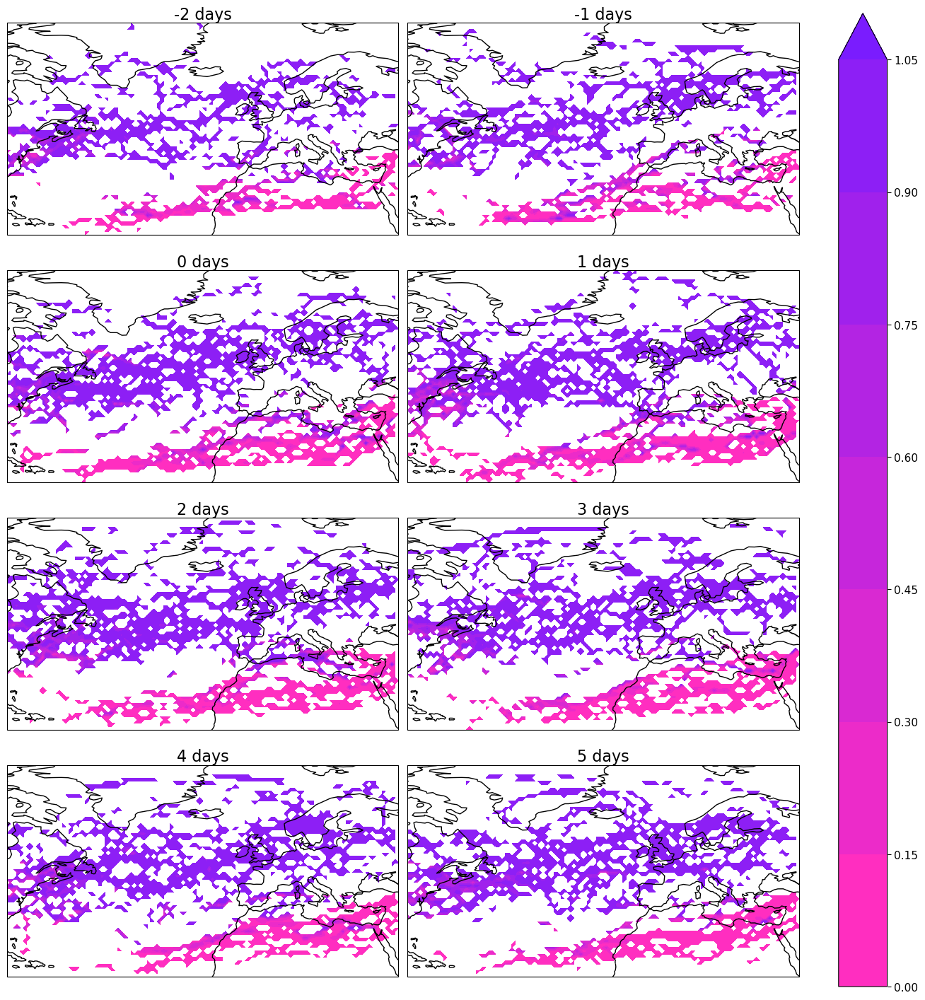

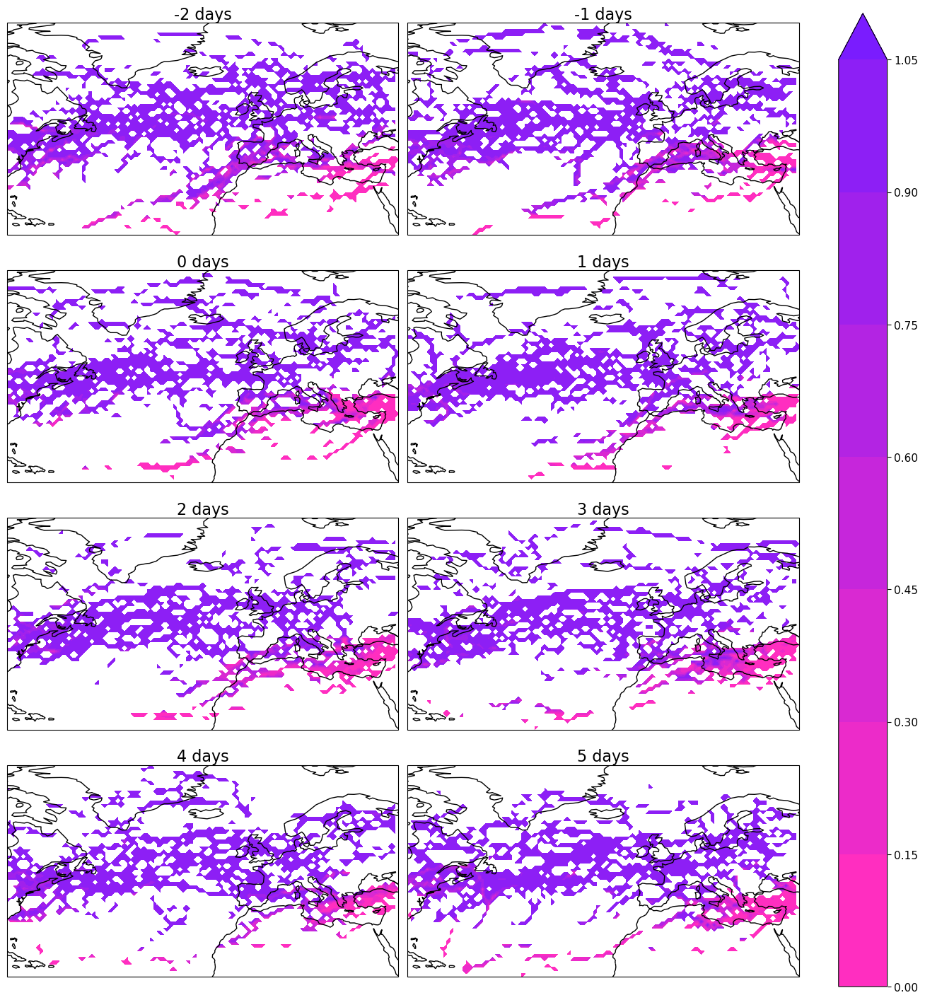

In [25]:
da = jet_pos_da.copy()
da = compute(da.sel(time=da.time.dt.season == "JJA"))
plot_kwargs = {
    "cmap": PINKPURPLE,
    "levels": 7
}

clu = Clusterplot(4, 2, get_region(da))
spells_from_jet_daily = spells_list_time_before["STJ lifetime"]
to_plot = mask_from_spells_pl(spells_from_jet_daily, da)
n_spells = to_plot.spell.shape[0]
print(n_spells)
to_plot = to_plot.mean("spell").sel(relative_index=[-2, -1, 0, 1, 2, 3, 4, 5])
_ = clu.add_contourf(
    to_plot,
    titles=to_plot.relative_time.values.astype("timedelta64[D]"),
    **plot_kwargs
)

clu = Clusterplot(4, 2, get_region(da))
spells_from_jet_daily = spells_list_time_before["EDJ lifetime"]
to_plot = mask_from_spells_pl(spells_from_jet_daily, da)
n_spells = to_plot.spell.shape[0]
print(n_spells)
to_plot = to_plot.mean("spell").sel(relative_index=[-2, -1, 0, 1, 2, 3, 4, 5])
_ = clu.add_contourf(
    to_plot,
    titles=to_plot.relative_time.values.astype("timedelta64[D]"),
    **plot_kwargs
)

23
24


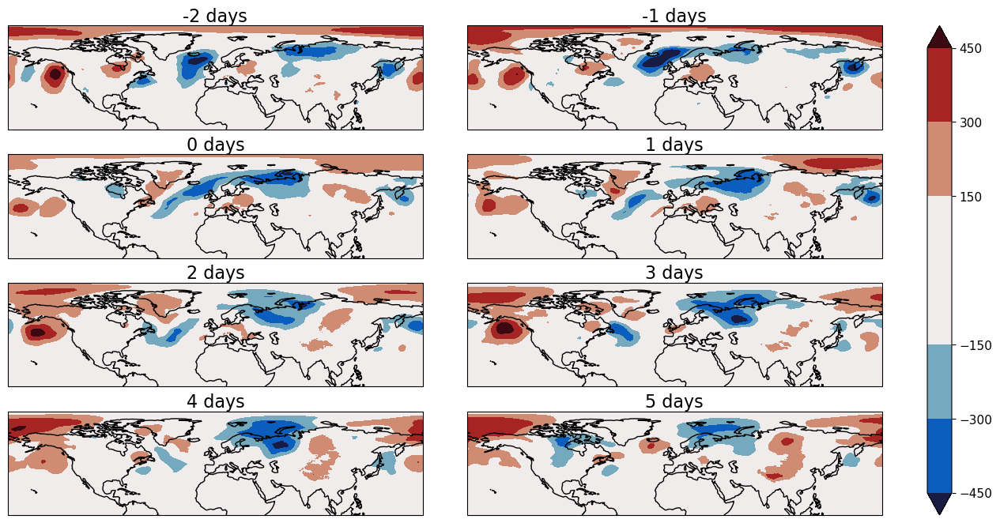

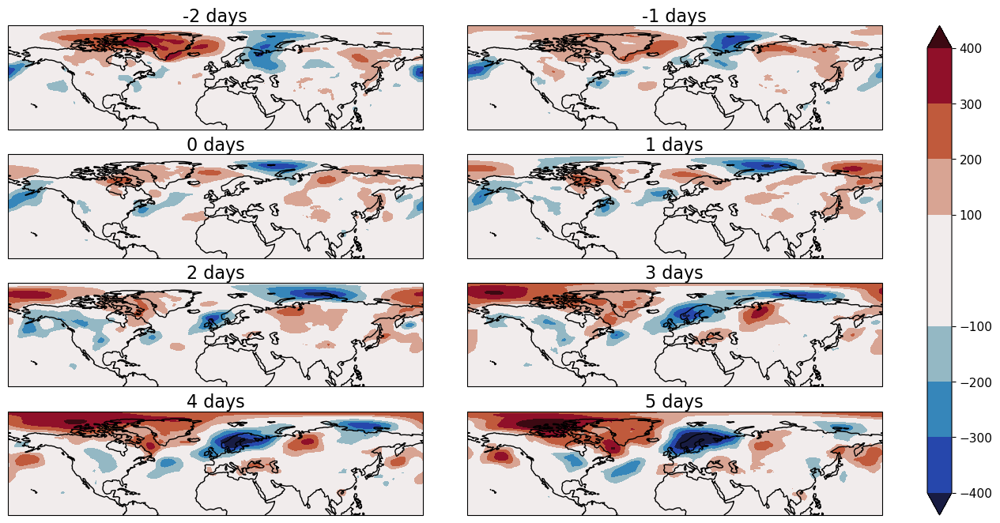

In [26]:
da = da_mslp.copy()
da = compute(da.sel(time=da.time.dt.season == "JJA"))
plot_kwargs = {
    "cmap": colormaps.balance,
    "levels": 7
}

clu = Clusterplot(4, 2, get_region(da))
spells_from_jet_daily = spells_list_time_before["STJ lifetime"]
to_plot = mask_from_spells_pl(spells_from_jet_daily, da)
n_spells = to_plot.spell.shape[0]
print(n_spells)
to_plot = to_plot.mean("spell").sel(relative_index=[-2, -1, 0, 1, 2, 3, 4, 5])
_ = clu.add_contourf(
    to_plot,
    titles=to_plot.relative_time.values.astype("timedelta64[D]"),
    **plot_kwargs
)

clu = Clusterplot(4, 2, get_region(da))
spells_from_jet_daily = spells_list_time_before["EDJ lifetime"]
to_plot = mask_from_spells_pl(spells_from_jet_daily, da)
n_spells = to_plot.spell.shape[0]
print(n_spells)
to_plot = to_plot.mean("spell").sel(relative_index=[-2, -1, 0, 1, 2, 3, 4, 5])
_ = clu.add_contourf(
    to_plot,
    titles=to_plot.relative_time.values.astype("timedelta64[D]"),
    **plot_kwargs
)

23
24


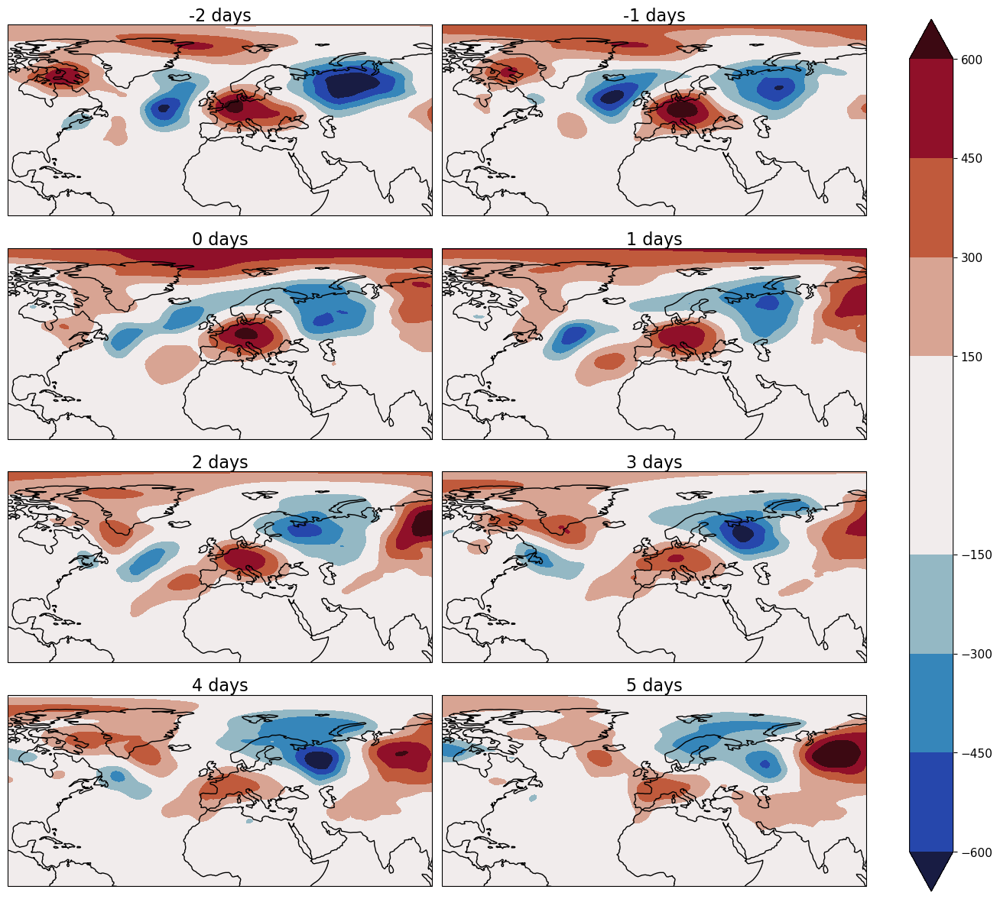

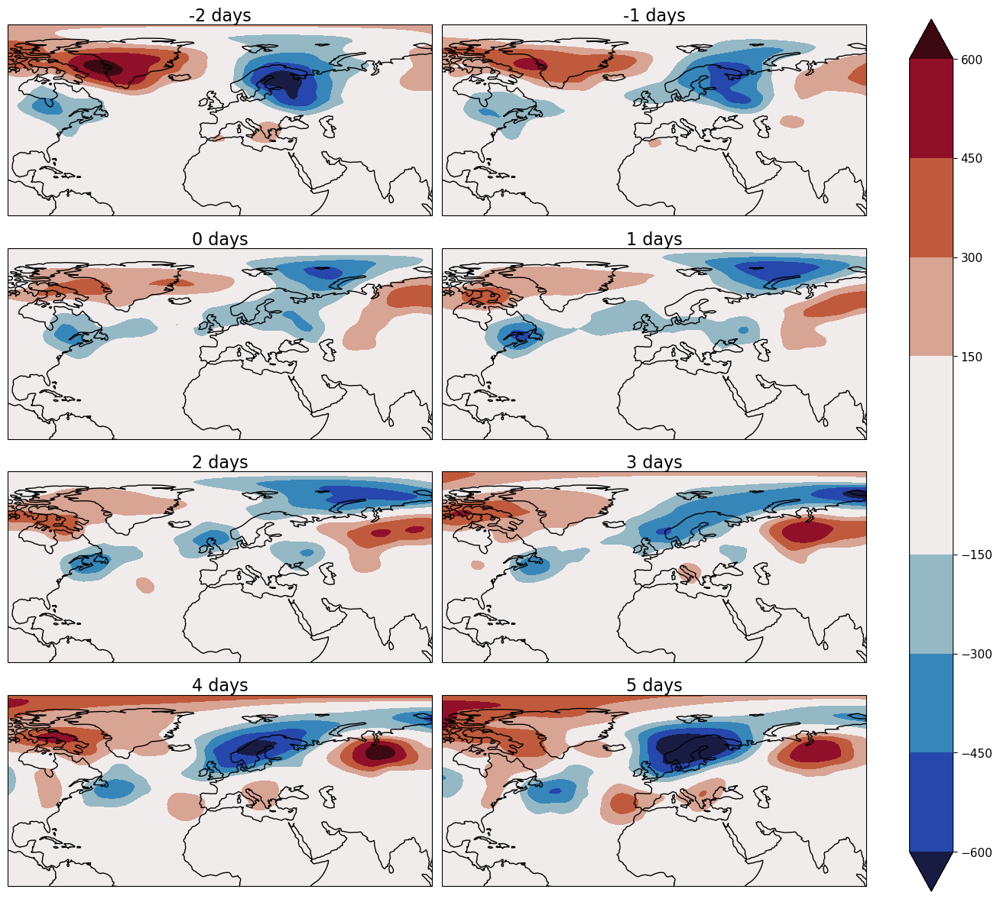

In [27]:
da = da_z.copy()
da = compute(da.sel(time=da.time.dt.season == "JJA"))
plot_kwargs = {
    "cmap": colormaps.balance,
    "levels": 7
}

clu = Clusterplot(4, 2, get_region(da))
spells_from_jet_daily = spells_list_time_before["STJ lifetime"]
to_plot = mask_from_spells_pl(spells_from_jet_daily, da)
n_spells = to_plot.spell.shape[0]
print(n_spells)
to_plot = to_plot.mean("spell").sel(relative_index=[-2, -1, 0, 1, 2, 3, 4, 5])
_ = clu.add_contourf(
    to_plot,
    titles=to_plot.relative_time.values.astype("timedelta64[D]"),
    **plot_kwargs
)

clu = Clusterplot(4, 2, get_region(da))
spells_from_jet_daily = spells_list_time_before["EDJ lifetime"]
to_plot = mask_from_spells_pl(spells_from_jet_daily, da)
n_spells = to_plot.spell.shape[0]
print(n_spells)
to_plot = to_plot.mean("spell").sel(relative_index=[-2, -1, 0, 1, 2, 3, 4, 5])
_ = clu.add_contourf(
    to_plot,
    titles=to_plot.relative_time.values.astype("timedelta64[D]"),
    **plot_kwargs
)

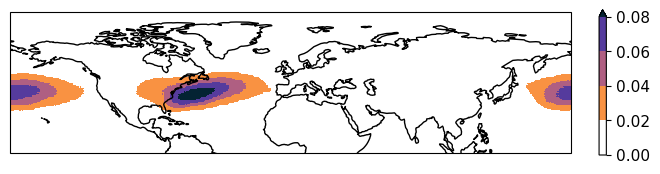

In [16]:
clu = Clusterplot(1, 1, get_region(da_apvs))
_ = clu.add_contourf([compute(da_apvs.mean("time"), progress_bar=True)], cmap=colormaps.thermal_r, transparify=1)

23
24


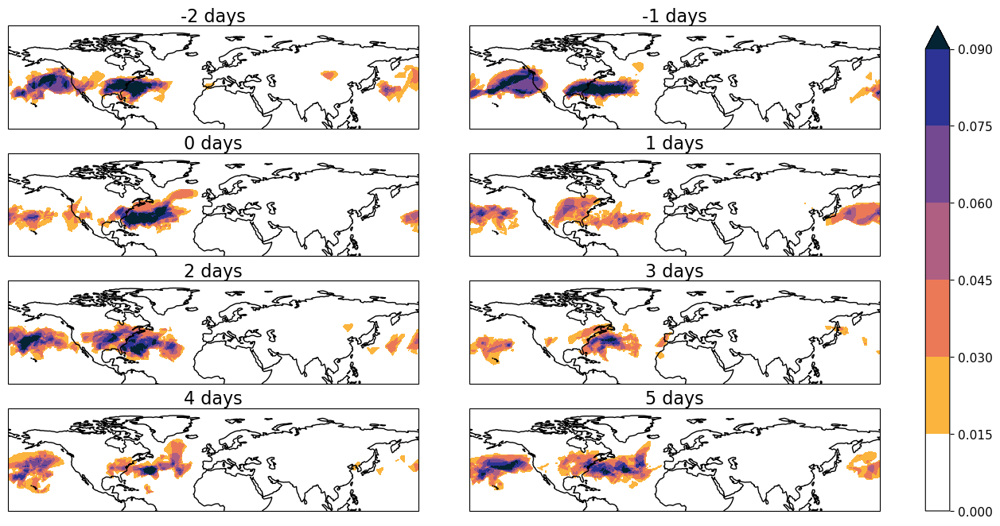

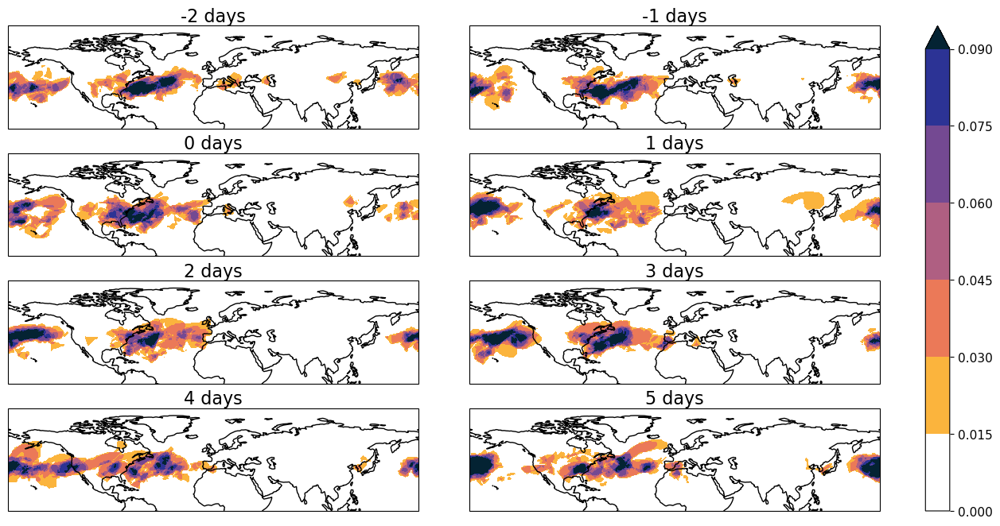

In [18]:
da = da_apvs.copy()
da = compute(da.sel(time=da.time.dt.season == "JJA"))
plot_kwargs = {
    "cmap": colormaps.thermal_r,
    "levels": 7,
    "transparify": 1,
}

clu = Clusterplot(4, 2, get_region(da))
spells_from_jet_daily = spells_list_time_before["STJ lifetime"]
to_plot = mask_from_spells_pl(spells_from_jet_daily, da)
n_spells = to_plot.spell.shape[0]
print(n_spells)
to_plot = to_plot.mean("spell").sel(relative_index=[-2, -1, 0, 1, 2, 3, 4, 5])
_ = clu.add_contourf(
    to_plot,
    titles=to_plot.relative_time.values.astype("timedelta64[D]"),
    **plot_kwargs
)

clu = Clusterplot(4, 2, get_region(da))
spells_from_jet_daily = spells_list_time_before["EDJ lifetime"]
to_plot = mask_from_spells_pl(spells_from_jet_daily, da)
n_spells = to_plot.spell.shape[0]
print(n_spells)
to_plot = to_plot.mean("spell").sel(relative_index=[-2, -1, 0, 1, 2, 3, 4, 5])
_ = clu.add_contourf(
    to_plot,
    titles=to_plot.relative_time.values.astype("timedelta64[D]"),
    **plot_kwargs
)

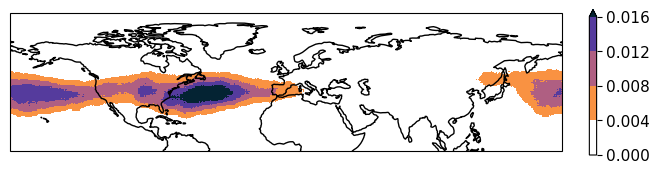

In [19]:
clu = Clusterplot(1, 1, get_region(da_cpvs))
_ = clu.add_contourf([compute(da_cpvs.mean("time"), progress_bar=True)], cmap=colormaps.thermal_r, transparify=1)

23
24


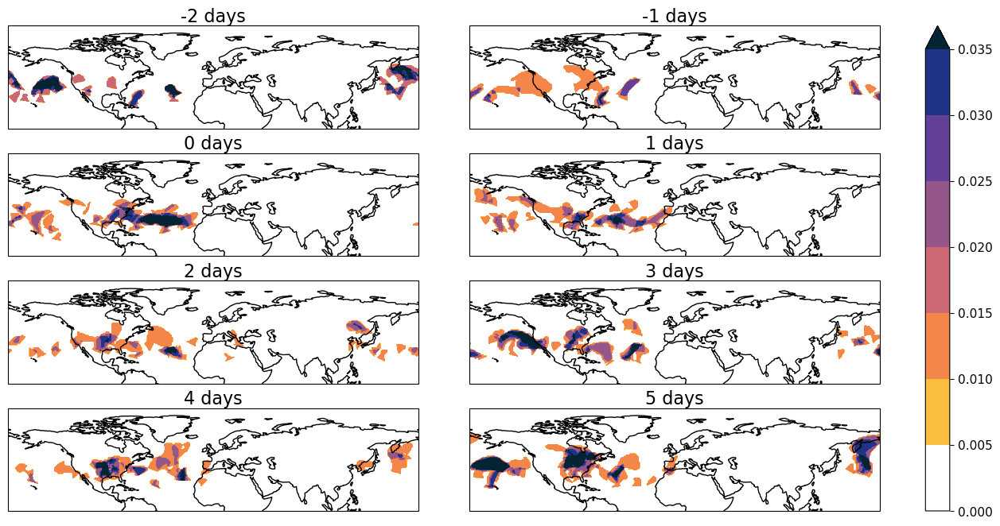

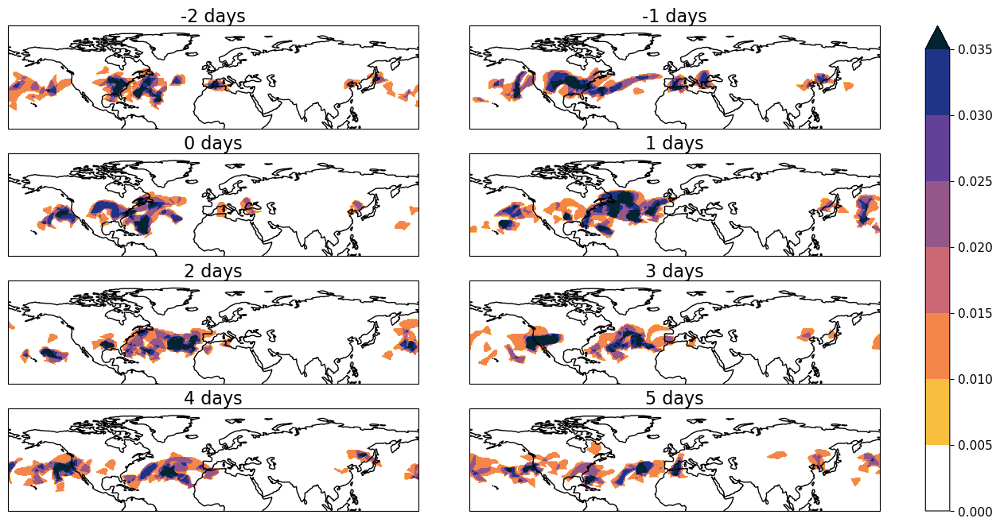

In [20]:
da = da_cpvs.copy()
da = compute(da.sel(time=da.time.dt.season == "JJA"))
plot_kwargs = {
    "cmap": colormaps.thermal_r,
    "levels": 7,
    "transparify": 1,
}

clu = Clusterplot(4, 2, get_region(da))
spells_from_jet_daily = spells_list_time_before["STJ lifetime"]
to_plot = mask_from_spells_pl(spells_from_jet_daily, da)
n_spells = to_plot.spell.shape[0]
print(n_spells)
to_plot = to_plot.mean("spell").sel(relative_index=[-2, -1, 0, 1, 2, 3, 4, 5])
_ = clu.add_contourf(
    to_plot,
    titles=to_plot.relative_time.values.astype("timedelta64[D]"),
    **plot_kwargs
)

clu = Clusterplot(4, 2, get_region(da))
spells_from_jet_daily = spells_list_time_before["EDJ lifetime"]
to_plot = mask_from_spells_pl(spells_from_jet_daily, da)
n_spells = to_plot.spell.shape[0]
print(n_spells)
to_plot = to_plot.mean("spell").sel(relative_index=[-2, -1, 0, 1, 2, 3, 4, 5])
_ = clu.add_contourf(
    to_plot,
    titles=to_plot.relative_time.values.astype("timedelta64[D]"),
    **plot_kwargs
)